# Preamble

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import calendar
import matplotlib.pyplot as plt
import dask.array
import cartopy.crs as ccrs
import matplotlib.colors as colors
import datetime as dt
from matplotlib.colors import BoundaryNorm
rb = plt.cm.RdBu
bm = plt.cm.Blues
best_blue = '#9bc2d5'
recherche_red = '#fbc4aa'
wondeful_white = '#f8f8f7'
import glob
import pdb

import warnings
warnings.filterwarnings('ignore')

import matplotlib.gridspec as gridspec

savedir = 'anomalies/'

import sys
from importlib import reload
sys.path.append('/home/563/ab2313/MJO/functions')


import subphase_calc_functions as subphase_calc
import subphase_plot_functions as subphase_plot

In [2]:
import load_dataset as load

In [3]:
nino34 = xr.open_dataset('nino34_daily_filled_month_average(00:00).nc')
nino34

<xarray.Dataset>
Dimensions:  (time: 16102)
Coordinates:
  * time     (time) datetime64[ns] 1974-10-01 1974-10-02 ... 2018-10-31
Data variables:
    nino34   (time) float64 ...
Attributes:
    Source:   BOM
    Extra:    This is a monthly average that has been made every day into tha...

In [4]:
rmm = load.load_rmm()
rmm

<xarray.Dataset>
Dimensions:    (time: 16832)
Coordinates:
  * time       (time) datetime64[ns] 1974-06-01 1974-06-02 ... 2020-06-30
Data variables:
    RMM1       (time) float64 1.634 1.603 1.516 1.51 ... -1.287 -1.268 -1.236
    RMM2       (time) float64 1.203 1.015 1.086 ... -0.1858 -0.2861 -0.4493
    phase      (time) int64 5 5 5 5 5 6 6 6 6 7 6 5 ... 2 1 1 1 1 1 1 1 1 1 1 1
    amplitude  (time) float64 2.029 1.897 1.865 1.831 ... 1.464 1.3 1.3 1.315

In [5]:
# This version of AWAP is just for the north, wet-season and for raindays
# awap = load.load_awap()
# awap

awap = xr.open_dataset('/g/data/w40/ab2313/awap_n2.nc')

In [6]:
awap

<xarray.Dataset>
Dimensions:  (lat: 53, lon: 178, time: 7822)
Coordinates:
  * time     (time) datetime64[ns] 1974-10-01 1974-10-02 ... 2017-12-31
  * lon      (lon) float64 112.0 112.2 112.5 112.8 ... 155.5 155.8 156.0 156.2
  * lat      (lat) float64 -23.0 -22.75 -22.5 -22.25 ... -10.5 -10.25 -10.0
Data variables:
    precip   (time, lat, lon) float32 ...
Attributes:
    info:     North of Australia; wet-season only; raindays only; time delta -9h

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Splitting AWAP </font></center></div>

In [8]:
subphase_calc = reload(subphase_calc)
# Split AWAP into the subphases: enhanced, suppressed, transition and inactive.
awap_split = subphase_calc.split_into_subphase(awap, rmm)

# All Values

## Count

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Count </font></center></div>


### Calculation

In [8]:
'''Calculation'''

raw = awap.precip
split = awap_split.precip
q = 95


subphase_calc = reload(subphase_calc) 
count_anomaly = subphase_calc.count_anomalies(raw, split, q)

In [47]:
count_anomaly.to_netcdf('/g/data/w40/ab2313/test/count_anomly.nc')

In [48]:
sum_anomaly.to_netcdf('/g/data/w40/ab2313/test/sum_anomly.nc')

In [9]:
subphase_calc = reload(subphase_calc)
enso_count_anomalies = subphase_calc.enso_count_anomalies(awap, q,nino34, rmm)

### Plotting

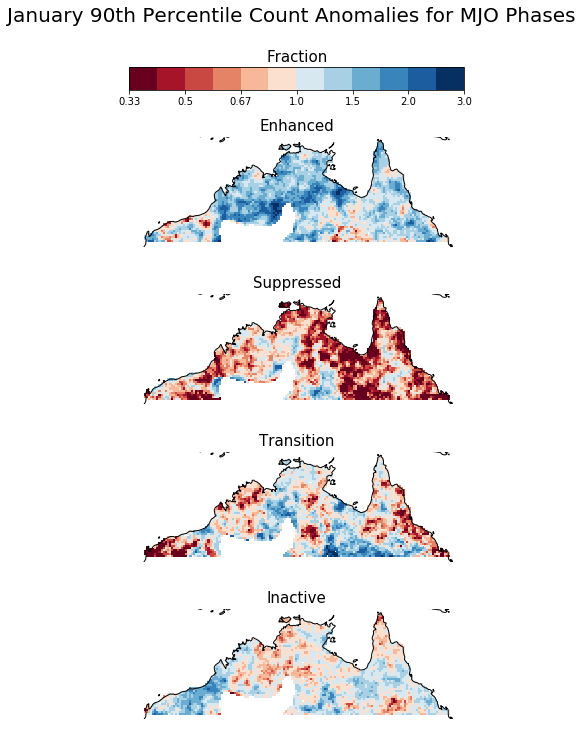

In [13]:
'''Sample Plot'''

subphase_plot = reload(subphase_plot)
month = 1
cbar_title = 'Fraction'
subphase_plot.anomalies_plots(count_anomaly.sel(month = month).precip, vmax = 3, cbar_title = cbar_title,
                             title = f'{calendar.month_name[month]} {q}th Percentile Count Anomalies for MJO Phases')

In [44]:
'''Saving All Plots'''

subphase_plot = reload(subphase_plot)
for month in [10,11,12,1,2,3]:

    cbar_title = 'Fraction'
    subphase_plot.anomalies_plots(count_anomaly.sel(month = month).precip, vmax = 3, cbar_title = cbar_title,
                                 title = f'{calendar.month_name[month]} {q}th Percentile Count Anomalies for MJO Phases',
                                 savefig = 1, dont_plot = 1, savedir = savedir + 'count/vanilla/')

saving:October 90th Percentile Count Anomalies for MJO Phases
saving:November 90th Percentile Count Anomalies for MJO Phases
saving:December 90th Percentile Count Anomalies for MJO Phases
saving:January 90th Percentile Count Anomalies for MJO Phases
saving:February 90th Percentile Count Anomalies for MJO Phases
saving:March 90th Percentile Count Anomalies for MJO Phases


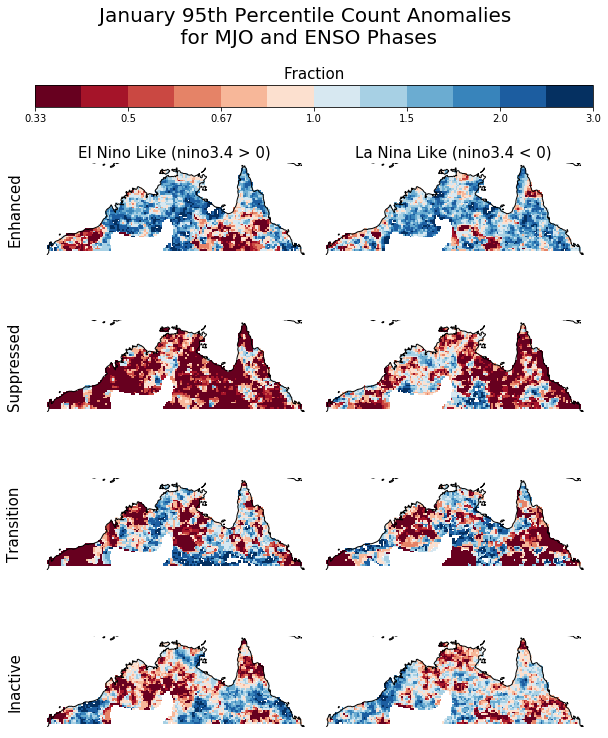

In [215]:
month = 1
subphase_plot = reload(subphase_plot)

title = f'{calendar.month_name[month]} {q}th Percentile Count Anomalies\n for MJO and ENSO Phases'
subphase_plot.enso_anomalies_plots(enso_count_anomalies.sel(month = month).precip,
                                   title = title, cbar_title = 'Fraction')

In [22]:
subphase_plot = reload(subphase_plot)

for month in [10,11,12,1,2,3]:
    title  = f'{calendar.month_name[month]} Count Anomalies for Rainfall > {q}th Percentile \n for MJO and ENSO Phases'
    subphase_plot.enso_anomalies_plots(enso_count_anomalies.sel(month = month).precip,
                                       title = title, cbar_title = 'Fraction',
                                      savefig = 1, dont_plot = 1, savedir = savedir + 'count/enso/' )

October Count Anomalies for Rainfall > 90th Percentile 
 for MJO and ENSO Phases has been save
November Count Anomalies for Rainfall > 90th Percentile 
 for MJO and ENSO Phases has been save
December Count Anomalies for Rainfall > 90th Percentile 
 for MJO and ENSO Phases has been save
January Count Anomalies for Rainfall > 90th Percentile 
 for MJO and ENSO Phases has been save
February Count Anomalies for Rainfall > 90th Percentile 
 for MJO and ENSO Phases has been save
March Count Anomalies for Rainfall > 90th Percentile 
 for MJO and ENSO Phases has been save


## Intensity

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Intensity </font></center></div>


### Calculation

In [14]:
raw = awap.precip
split = awap_split.precip
q = 95


subphase_calc = reload(subphase_calc) 
int_anomaly = subphase_calc.int_anomalies(raw, split, q)

In [15]:
subphase_calc = reload(subphase_calc)
q = 95

enso_int_anomalies = subphase_calc.enso_int_anomalies(awap, q,nino34, rmm)

### Plotting

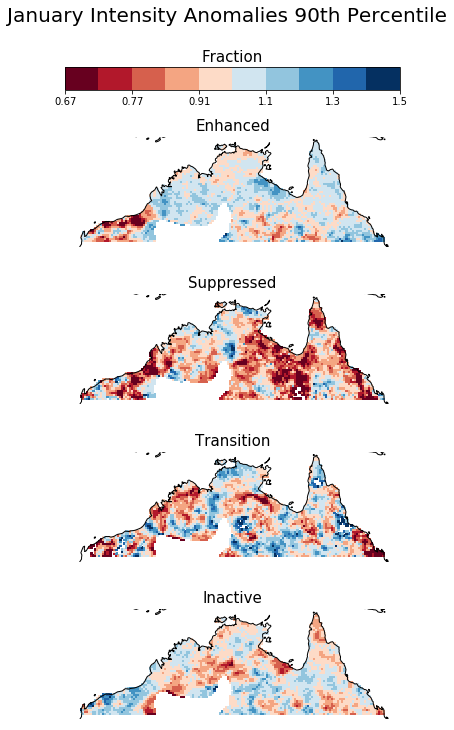

In [231]:
subphase_plot = reload(subphase_plot)
month = 1
cbar_title = 'Fraction'
subphase_plot.anomalies_plots(int_anomaly.sel(month = month).precip, vmax = 1.5, cbar_title = cbar_title,
                             title = f'{calendar.month_name[month]} Intensity Anomalies 90th Percentile')

In [157]:
'''Saving All Plots'''

subphase_plot = reload(subphase_plot)
for month in [10,11,12,1,2,3]:

    cbar_title = 'Fraction'
    subphase_plot.anomalies_plots(int_anomaly.sel(month = month).precip, vmax = 2, cbar_title = cbar_title,
                                 title = f'{calendar.month_name[month]} Intensity Anomalies 90th Percentile',
                                 savefig = 1, dont_plot = 1, savedir = savedir + 'int/')

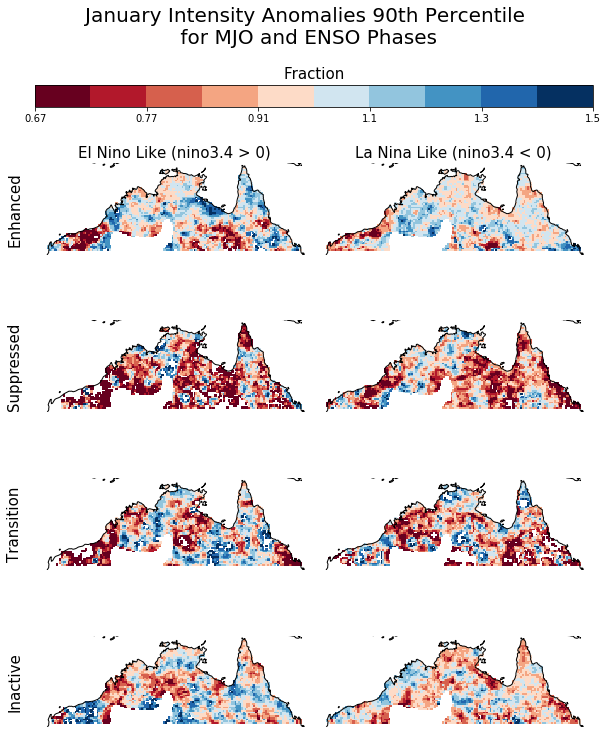

In [11]:
month = 1
subphase_plot = reload(subphase_plot)
vmax = 1.5
title = f'{calendar.month_name[month]} Intensity Anomalies 90th Percentile\n for MJO and ENSO Phases'

subphase_plot.enso_anomalies_plots(enso_int_anomalies.sel(month = month).precip, vmax = vmax,
                                   title = title, cbar_title = 'Fraction')

In [12]:
subphase_plot = reload(subphase_plot)

for month in [10,11,12,1,2,3]:
    title  = title = f'{calendar.month_name[month]} Intensity Anomalies 90th Percentile for\n MJO and ENSO Phases'
    subphase_plot.enso_anomalies_plots(enso_int_anomalies.sel(month = month).precip,
                                       title = title, cbar_title = 'Fraction',vmax = vmax,
                                      savefig = 1, dont_plot = 1, savedir = savedir + 'int/enso/' )

October Intensity Anomalies 90th Percentile for
 MJO and ENSO Phases has been save
November Intensity Anomalies 90th Percentile for
 MJO and ENSO Phases has been save
December Intensity Anomalies 90th Percentile for
 MJO and ENSO Phases has been save
January Intensity Anomalies 90th Percentile for
 MJO and ENSO Phases has been save
February Intensity Anomalies 90th Percentile for
 MJO and ENSO Phases has been save
March Intensity Anomalies 90th Percentile for
 MJO and ENSO Phases has been save


## Proportion

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Proportion </font></center></div>


### Calculation

In [17]:
raw = awap.precip
split = awap_split.precip
q = 95


subphase_calc = reload(subphase_calc) 
sum_anomaly = subphase_calc.sum_anomalies(raw, split, q)

In [18]:
q = 95
subphase_calc = reload(subphase_calc)

enso_sum_anomalies = subphase_calc.enso_sum_anomalies(awap, q,nino34, rmm)

### Plotting

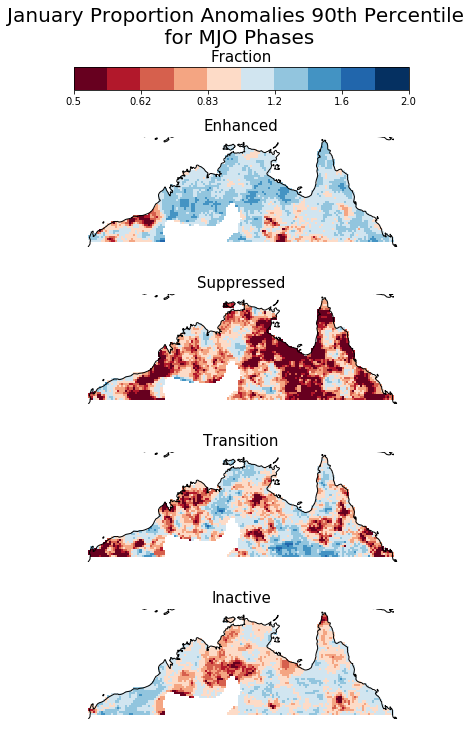

In [11]:
subphase_plot = reload(subphase_plot)
month = 1
cbar_title = 'Fraction'
subphase_plot.anomalies_plots(sum_anomaly.sel(month = month).precip, vmax = 2, cbar_title = cbar_title,
                             title = f'{calendar.month_name[month]} Proportion Anomalies {q}th Percentile\n for MJO Phases')

In [12]:
'''Saving All Plots'''

subphase_plot = reload(subphase_plot)
for month in [10,11,12,1,2,3]:

    cbar_title = 'Fraction'
    title = f'{calendar.month_name[month]} Proportion Anomalies {q}th Percentile\n for MJO Phases'
    subphase_plot.anomalies_plots(sum_anomaly.sel(month = month).precip, vmax = 2, cbar_title = cbar_title,
                                 title = title,
                                 savefig = 1, dont_plot = 1, savedir = savedir + 'sum/mjo/')

saving:October Proportion Anomalies 90th Percentile
 for MJO Phases
saving:November Proportion Anomalies 90th Percentile
 for MJO Phases
saving:December Proportion Anomalies 90th Percentile
 for MJO Phases
saving:January Proportion Anomalies 90th Percentile
 for MJO Phases
saving:February Proportion Anomalies 90th Percentile
 for MJO Phases
saving:March Proportion Anomalies 90th Percentile
 for MJO Phases


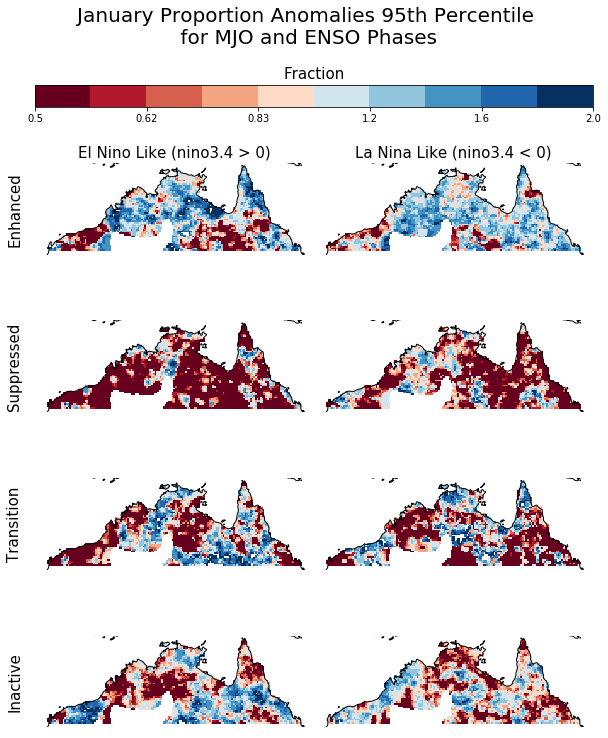

In [48]:
month = 1
subphase_plot = reload(subphase_plot)

title =f'{calendar.month_name[month]} Proportion Anomalies {q}th Percentile\n for MJO and ENSO Phases'

subphase_plot.enso_anomalies_plots(enso_sum_anomalies.sel(month = month).precip, vmax = 2,
                                   title = title, cbar_title = 'Fraction')

In [19]:


subphase_plot = reload(subphase_plot)

for month in [10,11,12,1,2,3]:
    title =f'{calendar.month_name[month]} Proportion Anomalies {q}th Percentile\n for MJO and ENSO Phases'
    subphase_plot.enso_anomalies_plots(enso_int_anomalies.sel(month = month).precip,
                                       title = title, cbar_title = 'Fraction', vmax = 2,
                                      savefig = 1, dont_plot = 1, savedir = savedir + 'sum/enso/' )

October Proportion Anomalies 95th Percentile
 for MJO and ENSO Phases has been save
November Proportion Anomalies 95th Percentile
 for MJO and ENSO Phases has been save
December Proportion Anomalies 95th Percentile
 for MJO and ENSO Phases has been save
January Proportion Anomalies 95th Percentile
 for MJO and ENSO Phases has been save
February Proportion Anomalies 95th Percentile
 for MJO and ENSO Phases has been save
March Proportion Anomalies 95th Percentile
 for MJO and ENSO Phases has been save


# Bootstrapping

## Creating Datasets

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Rainfall Datasets </font></center></div>


In [19]:
q = 95

subphase_calc = reload(subphase_calc)
'''Extremes (above qth percentile events)'''
# The events above the percentile
above_q = subphase_calc.unsplit_find_events_above_q(awap, q)
# MJO splitting
above_q_split  = subphase_calc.split_into_subphase(above_q, rmm)

# ENSO splitting
above_q_split_2  = subphase_calc.split_into_enso(above_q_split, nino34)


'''All events'''
# MJO splitting
normal_split  = subphase_calc.split_into_subphase(awap, rmm)

# ENSO splitting
nomral_split_2  = subphase_calc.split_into_enso(normal_split, nino34)


<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Resampled Datasets </font></center></div>


All of these data set are resamled to do either a count or a sum for each year and each sub-group (mjo phase and also month). This helps with making the bootstrapping faster

Extremes

In [20]:
# No Phase This is for the climatology (I guess), the count and also the sum of rainfall

subphase_calc = reload(subphase_calc)
above_q_count, above_q_sum = subphase_calc.year_resmaples(above_q)

In [21]:
# MJO Split

subphase_calc = reload(subphase_calc)
above_q_split_count, above_q_split_sum = subphase_calc.year_resmaples(above_q_split)

In [22]:
# ENSO and MJO split

subphase_calc = reload(subphase_calc)
above_q_split_2_count, above_q_split_2_sum = subphase_calc.year_resmaples(above_q_split_2)

Normal Events

In [23]:
# No Phase

subphase_calc = reload(subphase_calc)
normal_count, normal_sum = subphase_calc.year_resmaples(awap)

In [24]:
# MJO Split

subphase_calc = reload(subphase_calc)
normal_split_count, normal_split_sum = subphase_calc.year_resmaples(normal_split)

In [25]:
# ENSO and MJO split

subphase_calc = reload(subphase_calc)
normal_split_2_count, normal_split_2_sum = subphase_calc.year_resmaples(nomral_split_2)

## Count

### Boot Code

Count is extremes_phase / normal_phase 

In [26]:
def count_bootstrap(extreme, normal, loops = 1000):
    
    
    extreme = extreme.fillna(0)
    normal = normal.fillna(0)
    
    per = (100 - q)/100
    anomaly_stor = []

    for i in range(loops):

        # Initalising
        extreme_sum = extreme.isel(year=0).drop('year')*0
        normal_sum = normal.isel(year=0).drop('year')*0

        # Looping through 22 random years
        for y in np.random.randint(1974,2017,22):

            # This will return the sum of all the counts,whcih will be the total count
            extreme_sum += extreme.sel(year=y).drop('year')
            normal_sum += normal.sel(year=y).drop('year')


        anomaly = (extreme_sum/normal_sum)/per
        anomaly_stor.append(anomaly)
    
    # Putting all of the runs into the one xarray file
    total_count = xr.concat(anomaly_stor, pd.Index(np.arange(loops), name = 'run'))
    
    # Calculating the 90th and 10th percentile of all runs
    p90_count = total_count.reduce(np.nanpercentile, q = 90, dim = 'run')

    p10_count = total_count.reduce(np.nanpercentile, q = 10, dim = 'run')


    # Concatinating into the one dataset
    count_boot = xr.concat([p10_count,p90_count], pd.Index(['10','90'], name= 'percentile'))


    return count_boot

### Boot debug

In [122]:
def count_bootstrap_debug(extreme, normal, loops = 1000):
    
    
    extreme = extreme.fillna(0)
    normal = normal.fillna(0)
    
    per = (100 - q)/100
    anomaly_stor = []

    for i in range(loops):

        # Initalising: multiplying by zero gives an empty array
        extreme_sum = extreme.isel(year=0).drop('year')*0
        normal_sum = normal.isel(year=0).drop('year')*0

        # Looping through 22 random years
        for y in np.random.randint(1974,2017,22):

            # This will return the sum of all the counts,whcih will be the total count
            extreme_sum += extreme.sel(year=y).drop('year')
            normal_sum += normal.sel(year=y).drop('year')


#         anomaly = (extreme_sum/normal_sum)/per
#         anomaly_stor.append(anomaly)
    
    # Putting all of the runs into the one xarray file
#     total_count = xr.concat(anomaly_stor, pd.Index(np.arange(loops), name = 'run'))
    
#     # Calculating the 90th and 10th percentile of all runs
#     p90_count = total_count.reduce(np.nanpercentile, q = 90, dim = 'run')

#     p10_count = total_count.reduce(np.nanpercentile, q = 10, dim = 'run')


#     # Concatinating into the one dataset
#     count_boot = xr.concat([p10_count,p90_count], pd.Index(['10','90'], name= 'percentile'))


    return extreme_sum, normal_sum

In [123]:
e,mn = count_bootstrap_debug(above_q_split_count, normal_split_count, loops = 5)

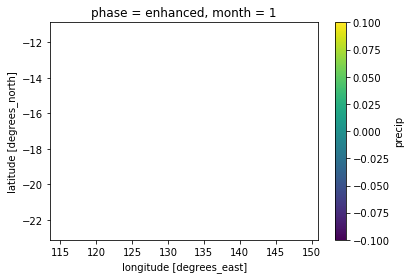

In [125]:
mn.sel(month = 1, phase = 'enhanced').precip.plot()

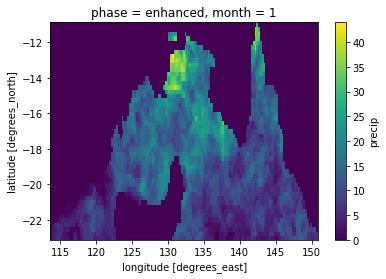

In [124]:
e.sel(month = 1, phase = 'enhanced').precip.plot()

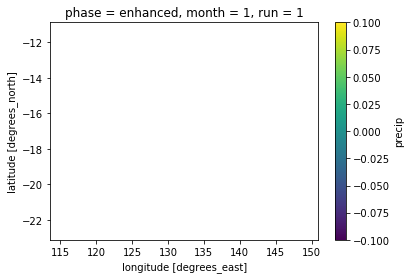

In [112]:
test.sel(month = 1, phase = 'enhanced', run = 1).precip.plot()

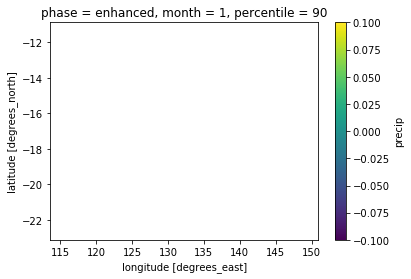

In [107]:
tets .sel(month = 1, phase = 'enhanced', percentile = '90').precip.plot()

### Vanilla

##### Calculation

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Actual Bootstrap</font></center></div>


In [27]:
count_boot_mjo = count_bootstrap(above_q_split_count, normal_split_count)

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Apllying to Actual Values </font></center></div>


In [28]:
# This is getting the dataset that is just the significant points


subphase_calc = reload(subphase_calc) 
count_anomaly_sig = subphase_calc.sel_sig_all(count_anomaly,count_boot_mjo)

#### Plain Plots

In [30]:
import subphase_plot_functions_2 as subplot_2

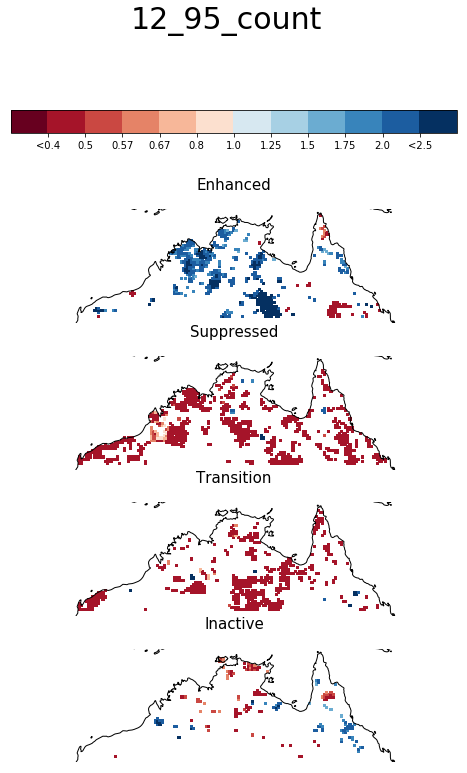

In [44]:
subplot_2 = reload(subplot_2)
month = 12
subplot_2.anomalies_plots_plain(
                                     count_anomaly_sig.sel(month = month).precip, \
                                    save_name = f'{str(month)}_95_count', vmax = 3)

In [45]:
save_count1 = 'anomalies/count/vanilla/'

10_95_count has been saved
11_95_count has been saved
12_95_count has been saved
1_95_count has been saved
2_95_count has been saved
3_95_count has been saved


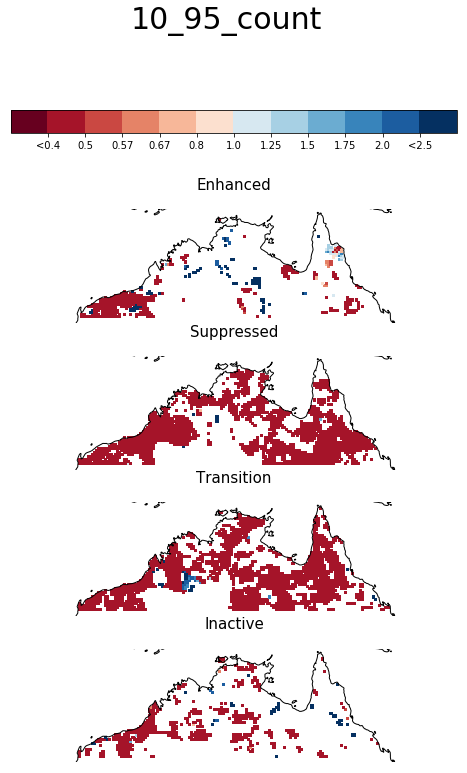

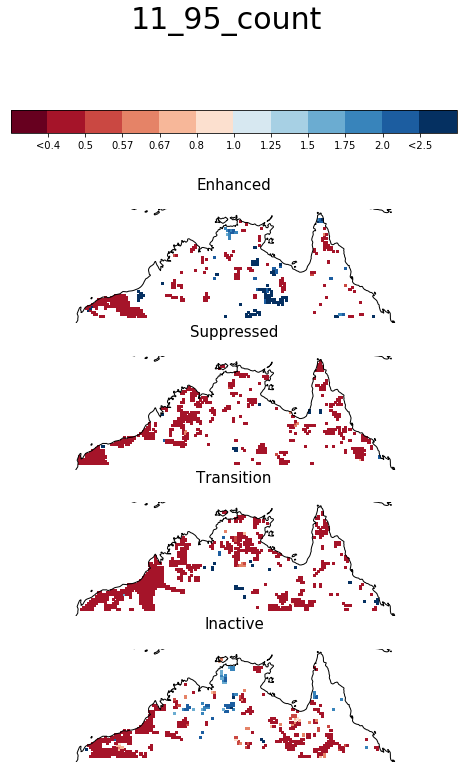

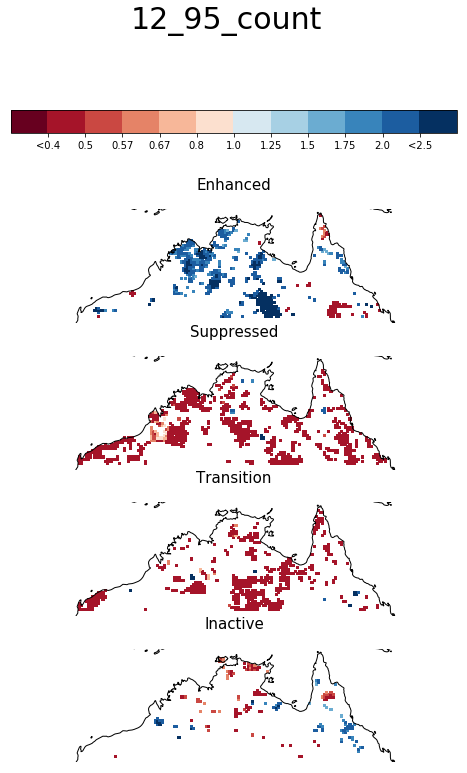

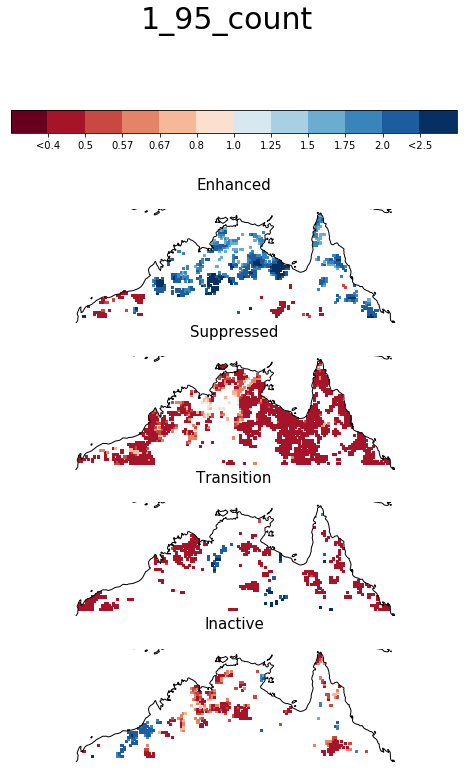

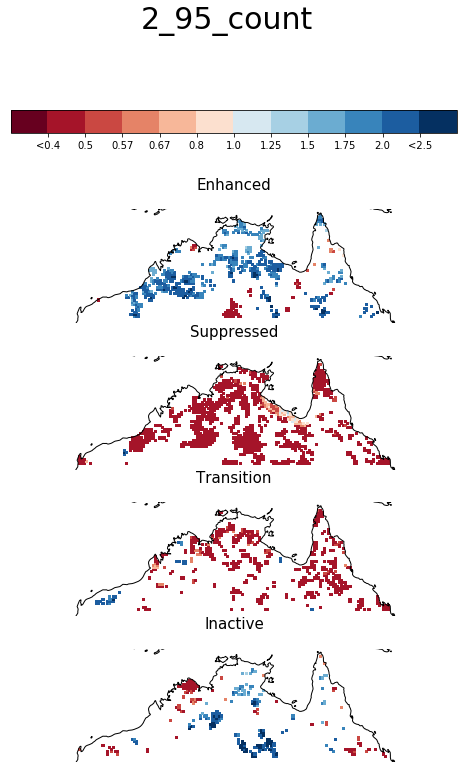

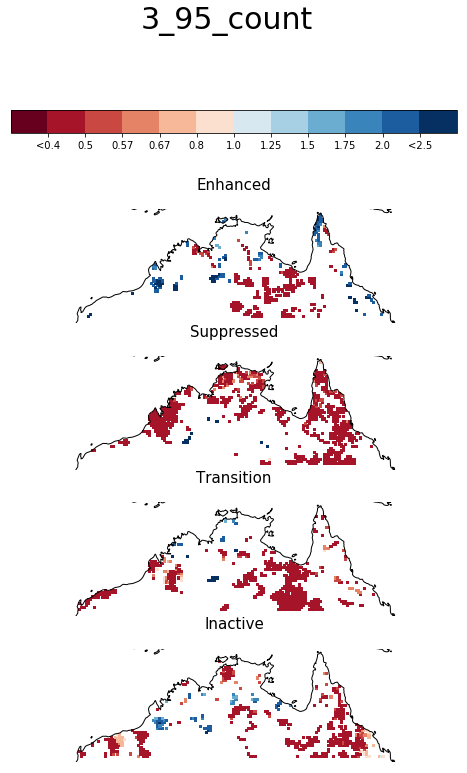

In [46]:
subplot_2 = reload(subplot_2)

for month in [10,11,12,1,2,3]:
    subplot_2.anomalies_plots_plain(
                                         count_anomaly_sig.sel(month = month).precip, \
                                        save_name = f'{str(month)}_95_count', vmax = 3, 
    savedir = save_count1)

#### Plotting Stippled

In [30]:
import subphase_plot_functions_2 as subplot_2

In [27]:
count_anomaly

<xarray.Dataset>
Dimensions:  (lat: 49, lon: 149, month: 6, phase: 4)
Coordinates:
  * lat      (lat) float64 -23.0 -22.75 -22.5 -22.25 ... -11.5 -11.25 -11.0
  * lon      (lon) float64 113.8 114.0 114.2 114.5 ... 150.0 150.2 150.5 150.8
  * phase    (phase) object 'enhanced' 'suppressed' 'transition' 'inactive'
  * month    (month) int64 1 2 3 10 11 12
Data variables:
    precip   (month, phase, lat, lon) float64 nan 1.719 2.113 ... nan nan nan

In [157]:
# This is getting the dataset that is just the significant points

subphase_calc = reload(subphase_calc) 
count_anomaly_90_sig = subphase_calc.sel_sig_all(count_anomaly,count_boot_mjo)

In [158]:
count_anomaly_90_sig

<xarray.Dataset>
Dimensions:  (lat: 49, lon: 149, month: 6, phase: 4)
Coordinates:
  * month    (month) int64 1 2 3 10 11 12
  * lat      (lat) float64 -23.0 -22.75 -22.5 -22.25 ... -11.5 -11.25 -11.0
  * lon      (lon) float64 113.8 114.0 114.2 114.5 ... 150.0 150.2 150.5 150.8
  * phase    (phase) object 'enhanced' 'suppressed' 'transition' 'inactive'
Data variables:
    precip   (month, phase, lat, lon) float64 nan nan nan 2.532 ... nan nan nan

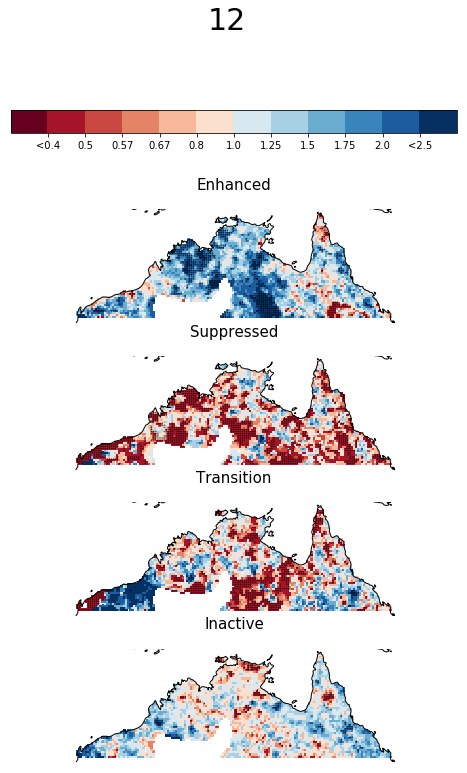

In [162]:
subplot_2 = reload(subplot_2)
month = 12
subplot_2.anomalies_plots_stippled_2(count_anomaly.sel(month = month).precip,
                                     count_anomaly_90_sig.sel(month = month).precip, \
                                    save_name = str(month))

In [163]:
savedir1 = 'anomalies_stippled/count/95/'

Count_95_October has been saved
Count_95_November has been saved
Count_95_December has been saved
Count_95_January has been saved
Count_95_February has been saved
Count_95_March has been saved


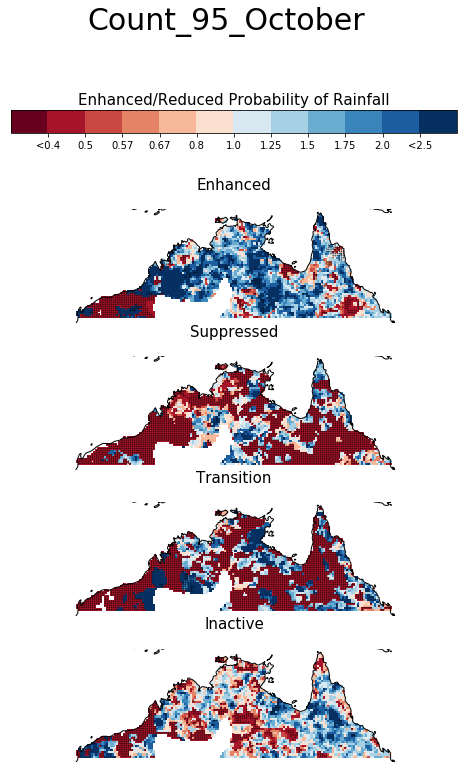

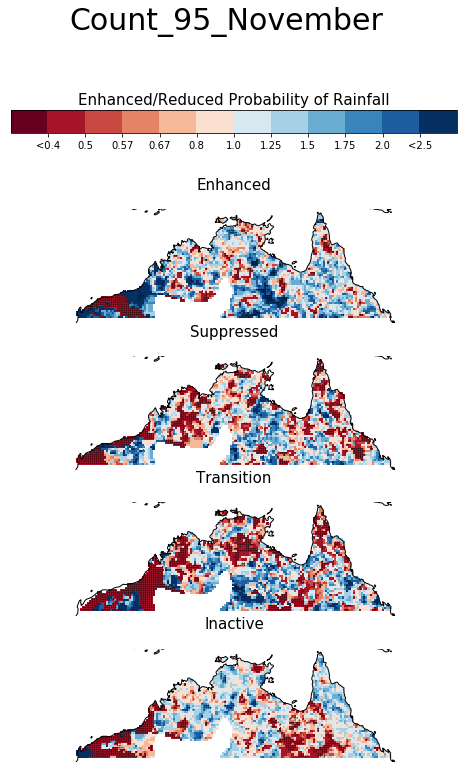

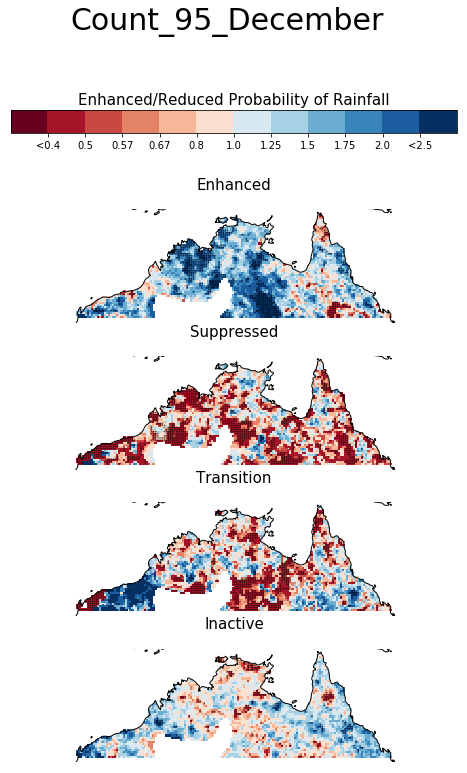

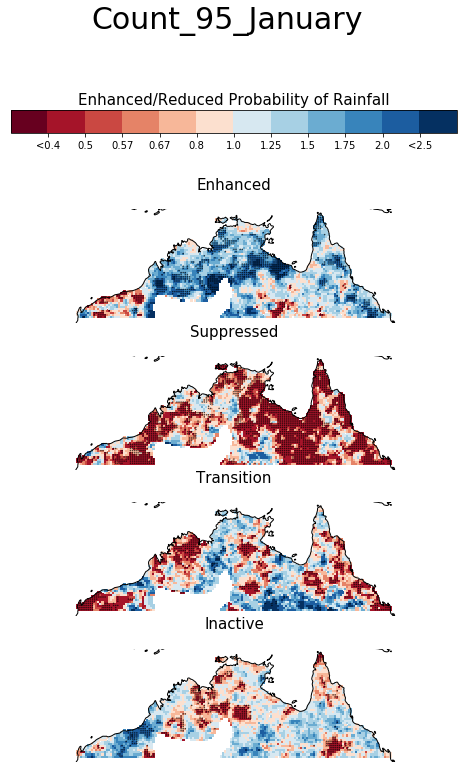

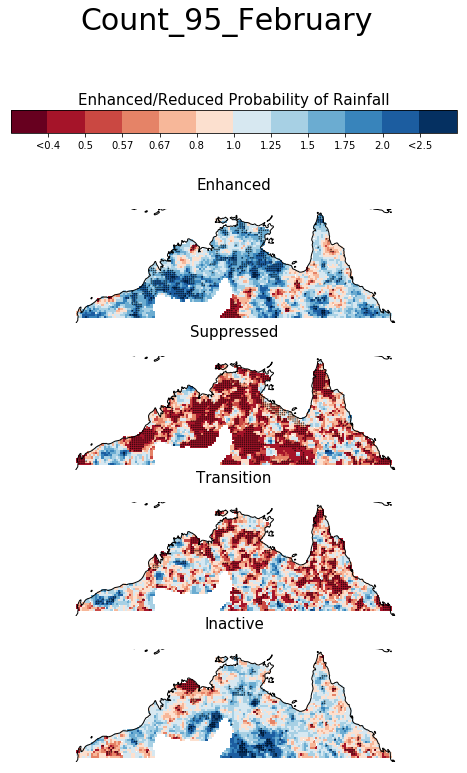

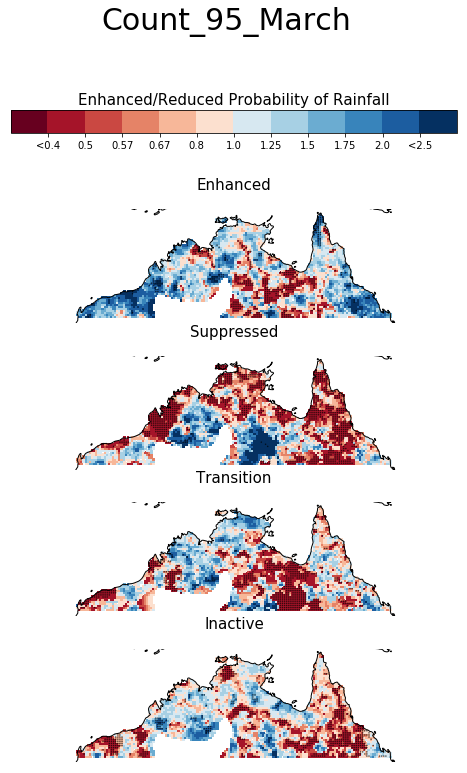

In [164]:
subphase_plot = reload(subphase_plot)

cbar_title = 'Enhanced/Reduced Probability of Rainfall'

for month in [10,11,12,1,2,3]:
    
    save_name = f'Count_95_{calendar.month_name[month]}'
    subplot_2.anomalies_plots_stippled_2(count_anomaly.sel(month = month).precip,
                                         count_anomaly_90_sig.sel(month = month).precip,
                                         cbar_title = cbar_title, save_name = save_name,
                                         savedir = savedir1
                                        )

### ENSO

#### Code

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Actual Bootstrap</font></center></div>


Actual Bootstrapping Code

In [48]:
count_boot_enso = count_bootstrap(above_q_split_2_count, normal_split_2_count)

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Apllying to Actual Values </font></center></div>


In [50]:
# This is getting the dataset that is just the significant points

subphase_calc = reload(subphase_calc) 
count_anomaly_sig_enso = subphase_calc.sel_sig_all(enso_count_anomalies,count_boot_enso)

In [51]:
count_anomaly_sig_enso

<xarray.Dataset>
Dimensions:  (lat: 49, lon: 149, month: 6, nino: 2, phase: 4)
Coordinates:
  * month    (month) int64 1 2 3 10 11 12
  * nino     (nino) object 'el nino' 'la nina'
  * phase    (phase) object 'enhanced' 'suppressed' 'transition' 'inactive'
  * lat      (lat) float64 -23.0 -22.75 -22.5 -22.25 ... -11.5 -11.25 -11.0
  * lon      (lon) float64 113.8 114.0 114.2 114.5 ... 150.0 150.2 150.5 150.8
Data variables:
    precip   (month, nino, phase, lat, lon) float64 nan nan nan ... nan nan nan

#### Plain Plots

In [55]:
save_count2 = 'anomalies/count/enso/'

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Plotting </font></center></div>


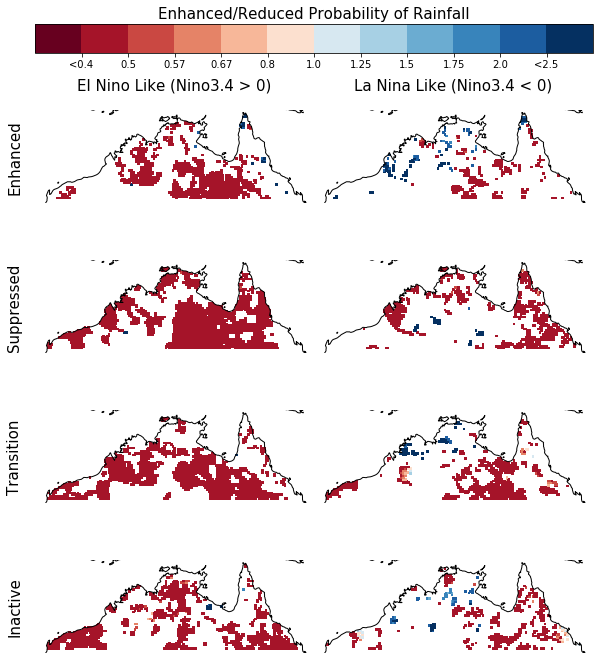

In [53]:

subplot_2 = reload(subplot_2) 

cbar_title = 'Enhanced/Reduced Probability of Rainfall'
subplot_2.enso_anomalies_plots_stippled(count_anomaly_sig_enso.sel(month = month).precip,
                                       cbar_title = cbar_title)

10_count_95 has been saved
11_count_95 has been saved
12_count_95 has been saved
1_count_95 has been saved
2_count_95 has been saved
3_count_95 has been saved


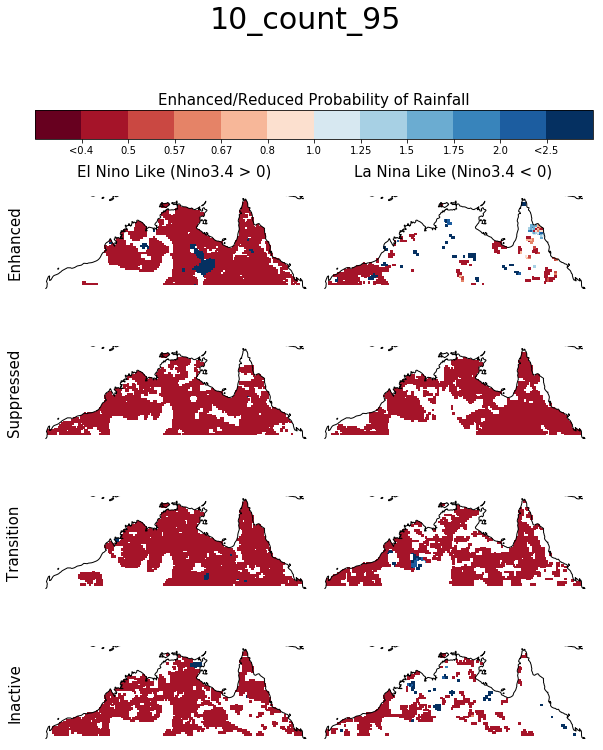

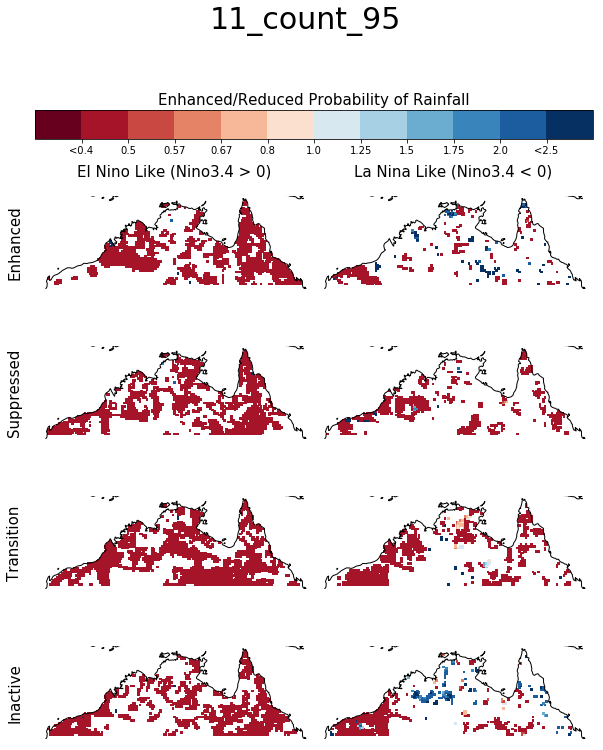

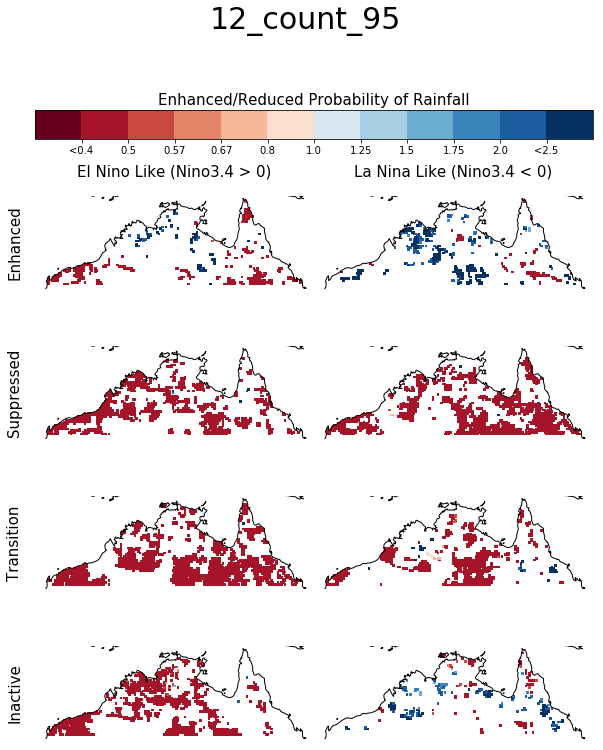

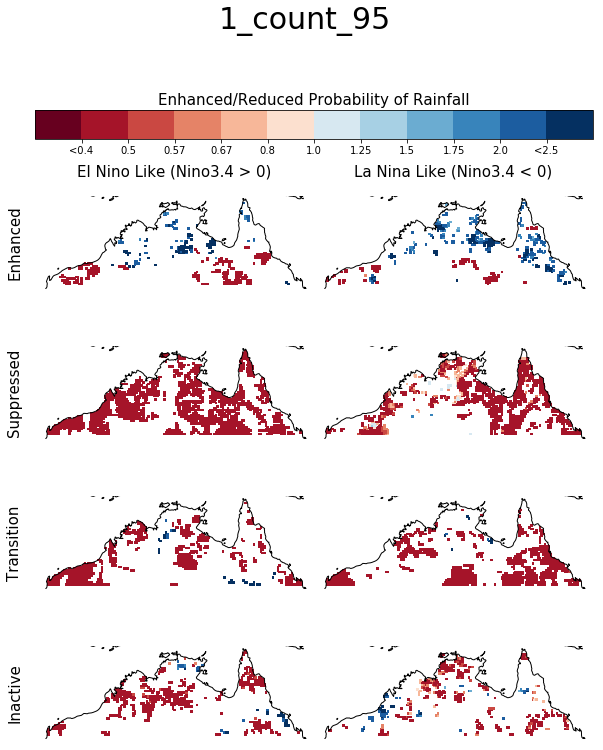

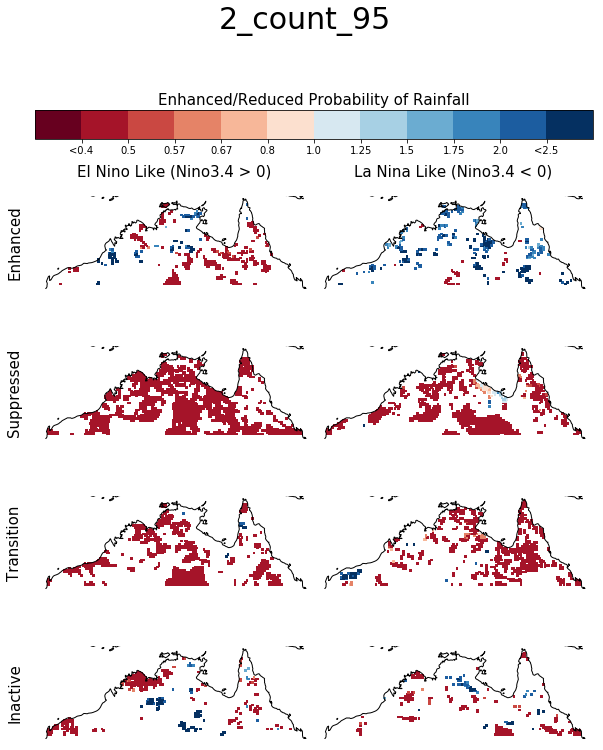

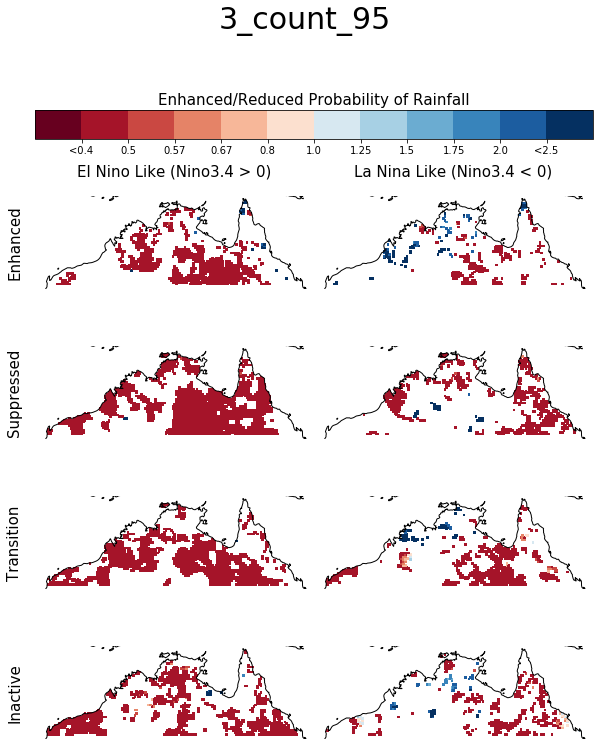

In [59]:
subphase_plot = reload(subphase_plot)
save_count2 = 'anomalies/count/enso/'
for month in [10,11,12,1,2,3]:
    subplot_2.enso_anomalies_plots_stippled(count_anomaly_sig_enso.sel(month = month).precip,
                                       cbar_title = cbar_title,
                                            save_name = f'{month}_count_95',savedir = save_count2)

#### Stippling Plots

In [ ]:

subplot_2 = reload(subplot_2) 

cbar_title = 'Enhanced/Reduced Probability of Rainfall'
subplot_2.enso_anomalies_plots_stippled(enso_int_anomalies.sel(month = month).precip,
                              count_anomaly_90_sig_enso.sel(month = month).precip,
                                       cbar_title = cbar_title)
                              

In [227]:
savedir1 = 'anomalies_stippled/count/95/'

ENSO_Count_95_October has been saved
ENSO_Count_95_November has been saved
ENSO_Count_95_December has been saved
ENSO_Count_95_January has been saved
ENSO_Count_95_February has been saved
ENSO_Count_95_March has been saved


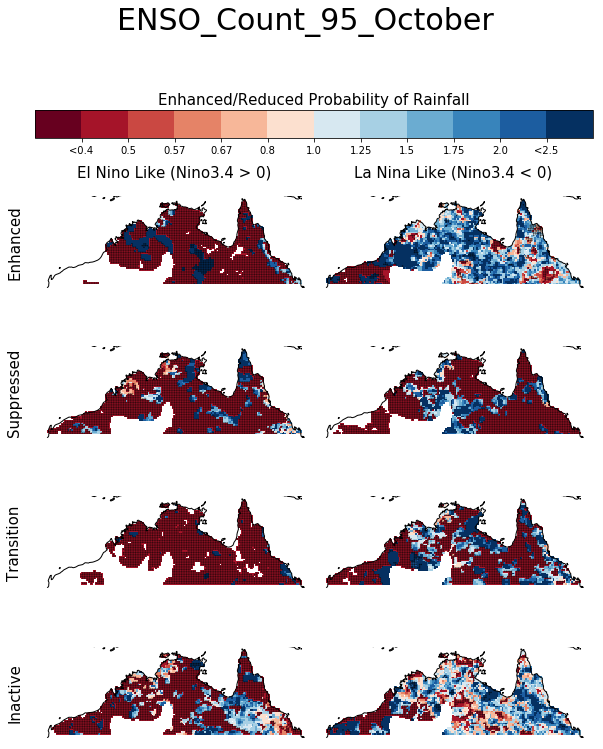

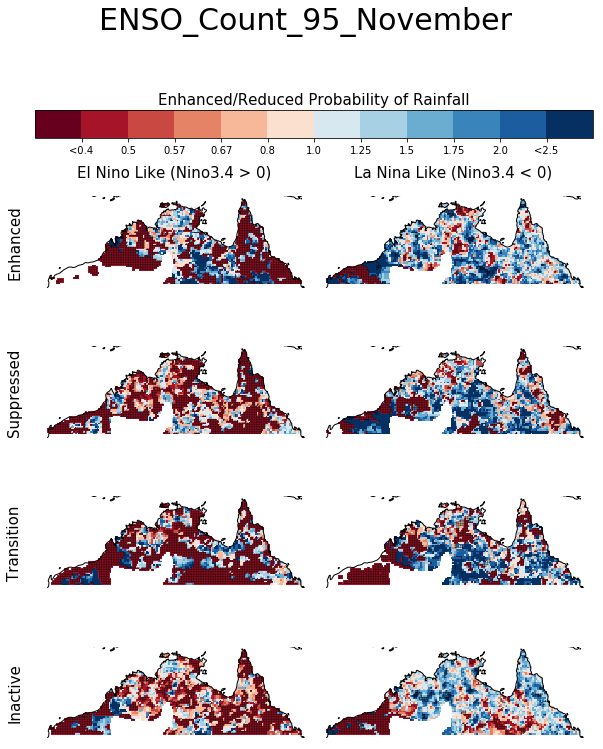

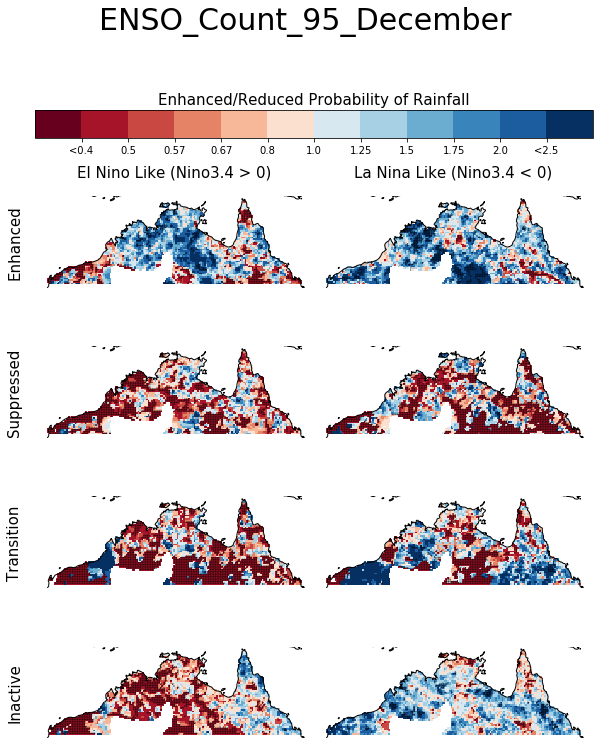

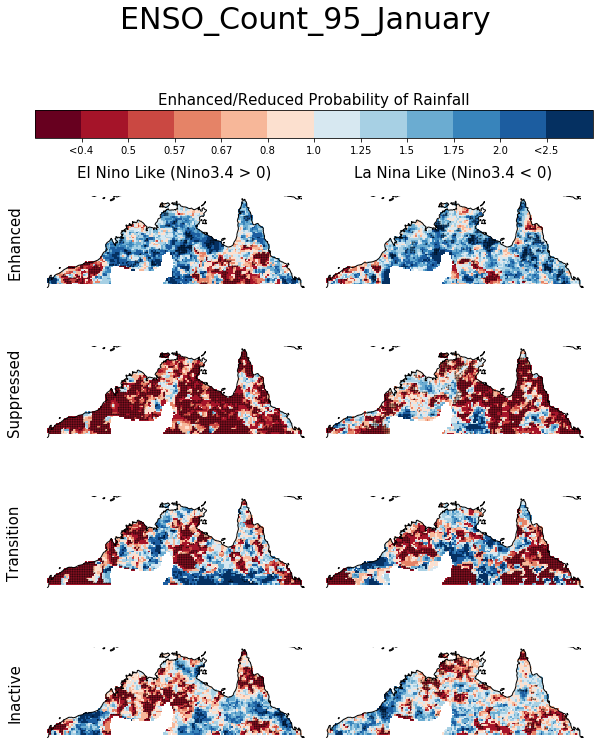

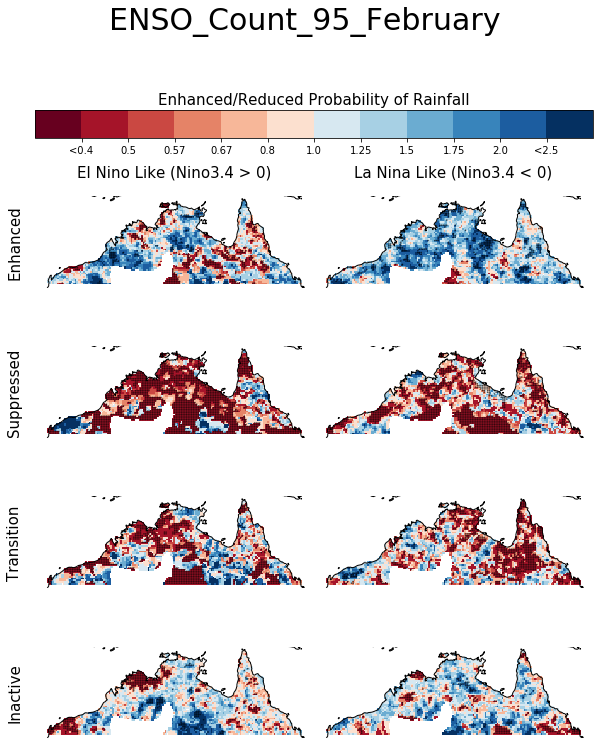

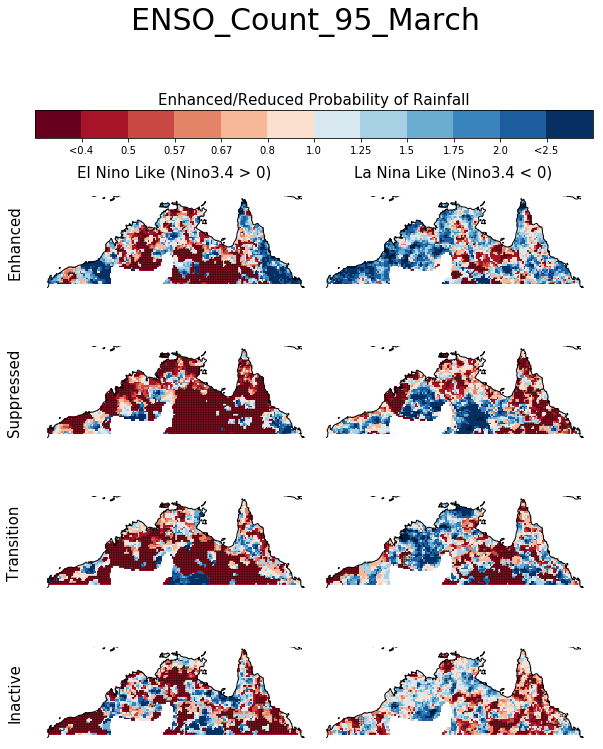

In [228]:
subphase_plot = reload(subphase_plot)

cbar_title = 'Enhanced/Reduced Probability of Rainfall'

for month in [10,11,12,1,2,3]:
    
    save_name = f'ENSO_Count_95_{calendar.month_name[month]}'
    subplot_2.enso_anomalies_plots_stippled(enso_count_anomalies.sel(month = month).precip,
                              count_anomaly_90_sig_enso.sel(month = month).precip,
                                         cbar_title = cbar_title, save_name = save_name,
                                         savedir = savedir1
                                        )

## Int

### Code

In [60]:
def int_boot_calc(phase_sum_q,phase_count_q ,all_sum_q ,all_count_q ):
    
    phase_count_q = phase_count_q.fillna(0)
    phase_sum_q = phase_sum_q.fillna(0)
    all_sum_q = all_sum_q.fillna(0)
    all_count_q = all_count_q.fillna(0)
    
    
    anomaly_stor_int = []

    loops = 1000
    for i in range(loops):

        # Initalising
        phase_sum = phase_sum_q.isel(year=0).drop('year')*0
        phase_count = phase_count_q.isel(year=0).drop('year')*0

        all_sum = all_sum_q.isel(year=0).drop('year')*0
        all_count = all_count_q.isel(year=0).drop('year')*0

        # Looping through 22 random years
        for y in np.random.randint(1974,2017,22):
            # The sum of sums, this will be the numertor for the mean fraction
            phase_sum += phase_sum_q.sel(year=y).drop('year')
            phase_count += phase_count_q.sel(year=y).drop('year')

            all_sum += all_sum_q.sel(year=y).drop('year')
            all_count += all_count_q.sel(year=y).drop('year')
        
        # Thsi is the phase mean
        phase_mean = phase_sum/phase_count
        
        # This is the overall mean
        all_mean = all_sum/ all_count

        anomaly = phase_mean/all_mean
        anomaly_stor_int.append(anomaly)

    total_int = xr.concat(anomaly_stor_int, pd.Index(np.arange(loops), name = 'run'))

    p90_int = total_int.reduce(np.nanpercentile, q = 90, dim = 'run')

    p10_int = total_int.reduce(np.nanpercentile, q = 10, dim = 'run')


    # Concatinating into the one dataset
    int_boot = xr.concat([p10_int,p90_int], pd.Index(['10','90'], name= 'percentile'))


    return int_boot

The mean will be the sum of all the events divided by the total number of events. So I will need the count array as defined above.

### Vanilla

#### Calculation

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Bootstrapping </font></center></div>


* This will be the mean(events in phase)/ mean(events)
* mean(events in phase) = sum(total rainfall each year)/ sum(number of events each year)
* mean(events) = sum(total rainfaill)/ sum(number of events)



In [61]:
int_boot = int_boot_calc( above_q_split_sum,above_q_split_count,above_q_sum, above_q_count)

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Apllying to Actual Values </font></center></div>


In [62]:
# This is getting the dataset that is just the significant points

subphase_calc = reload(subphase_calc) 
int_anomaly_sig = subphase_calc.sel_sig_all(int_anomaly,int_boot)

In [63]:
int_anomaly_sig

<xarray.Dataset>
Dimensions:  (lat: 49, lon: 149, month: 6, phase: 4)
Coordinates:
  * month    (month) int64 1 2 3 10 11 12
  * lat      (lat) float64 -23.0 -22.75 -22.5 -22.25 ... -11.5 -11.25 -11.0
  * phase    (phase) object 'enhanced' 'suppressed' 'transition' 'inactive'
  * lon      (lon) float64 113.8 114.0 114.2 114.5 ... 150.0 150.2 150.5 150.8
Data variables:
    precip   (month, phase, lat, lon) float32 nan nan nan nan ... nan nan nan

#### Plot Stip

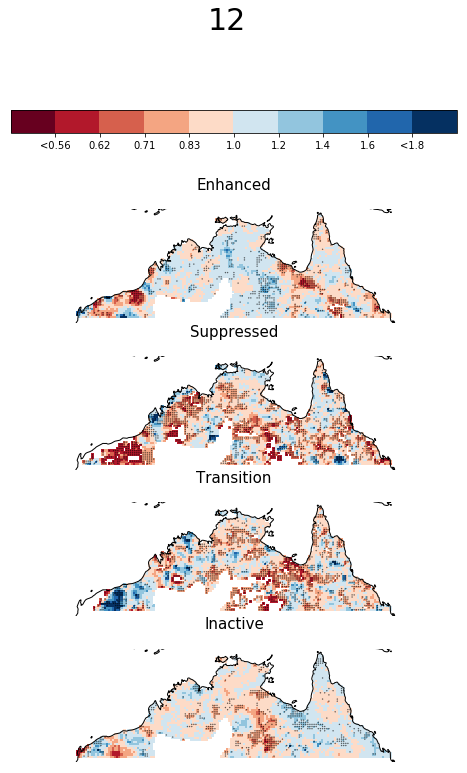

In [276]:
subplot_2 = reload(subplot_2)
month = 12
subplot_2.anomalies_plots_stippled_2(int_anomaly.sel(month = month).precip,
                                     int_anomaly_sig.sel(month = month).precip, \
                                    save_name = str(month), vmax = 2)

Int_95_October has been saved
Int_95_November has been saved
Int_95_December has been saved
Int_95_January has been saved
Int_95_February has been saved
Int_95_March has been saved


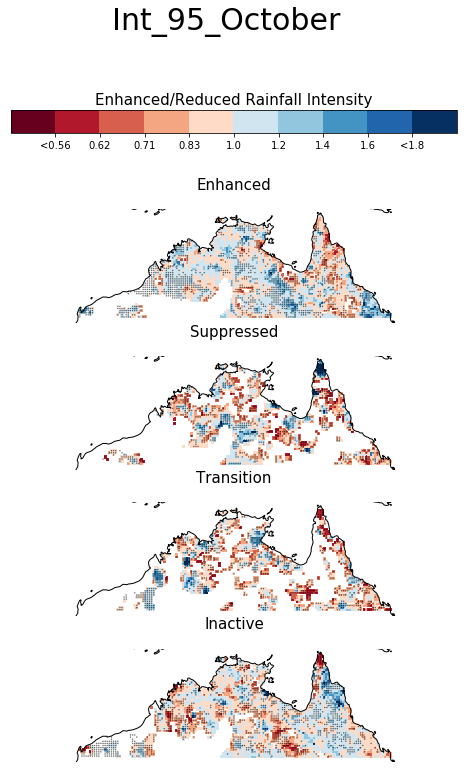

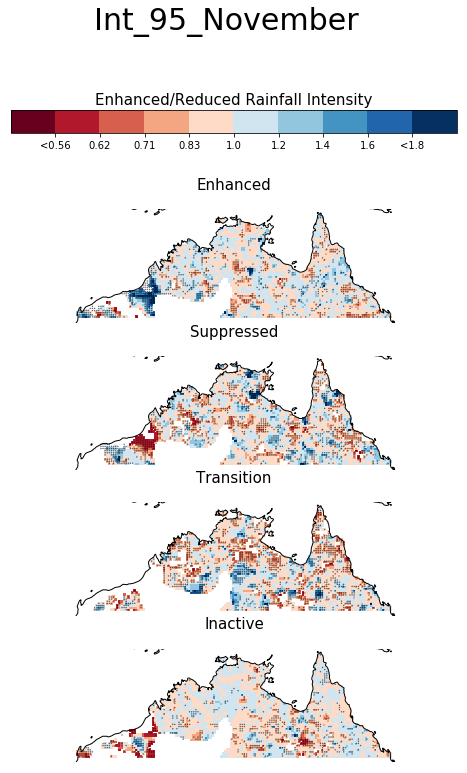

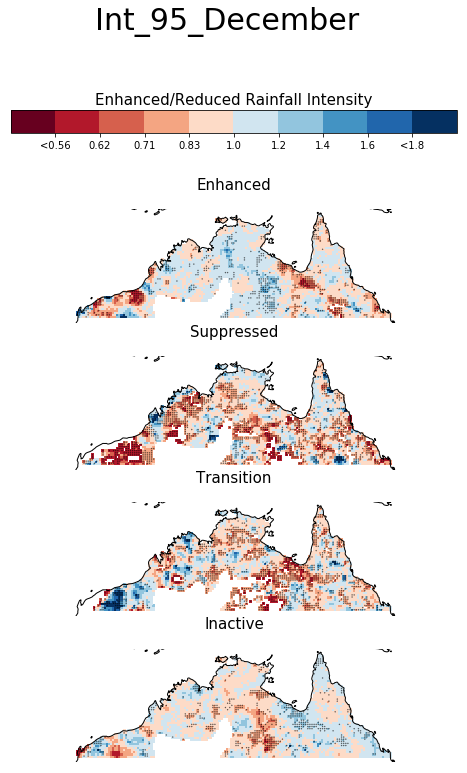

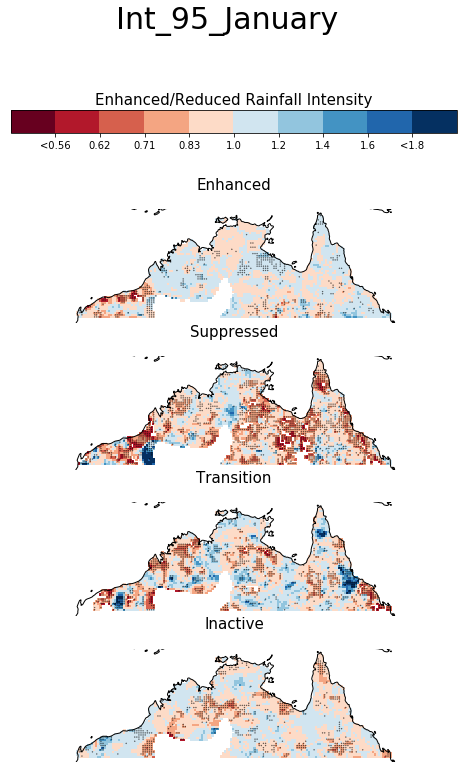

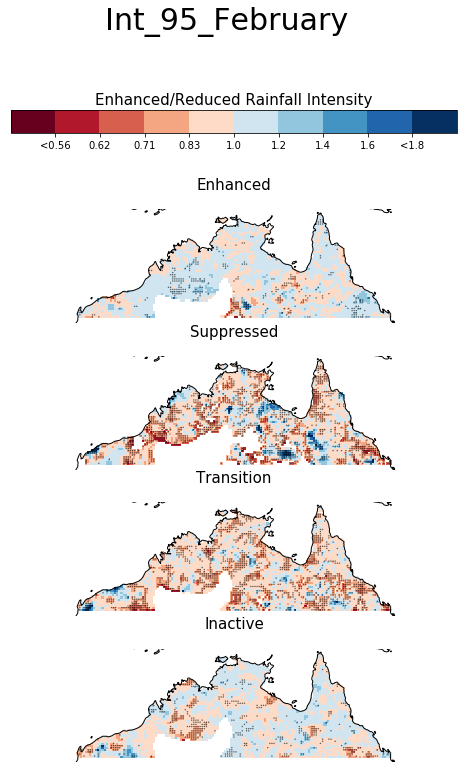

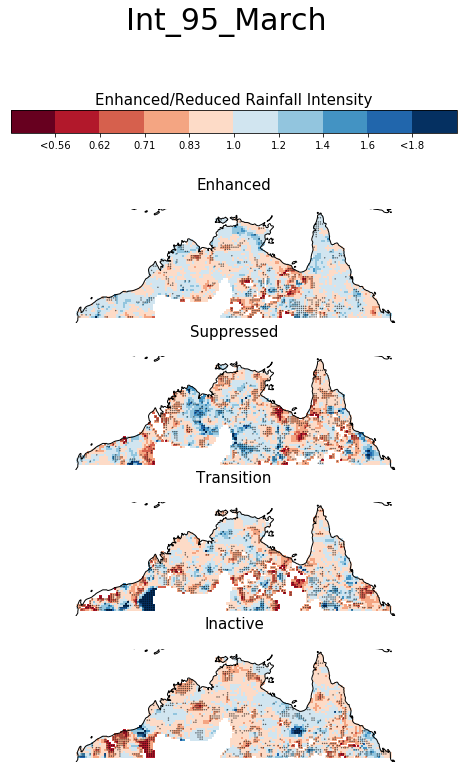

In [277]:
subplot_2 = reload(subplot_2)
cbar_title = 'Enhanced/Reduced Rainfall Intensity'

for month in [10,11,12,1,2,3]:

    save_name = f'Int_95_{calendar.month_name[month]}'
    
    subplot_2.anomalies_plots_stippled_2(int_anomaly.sel(month = month).precip,
                                         int_anomaly_sig.sel(month = month).precip, \
                                        save_name =  save_name, vmax = 2, 
                                         cbar_title = cbar_title, savedir = savedir2)

#### Plot Plain

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Plotting </font></center></div>


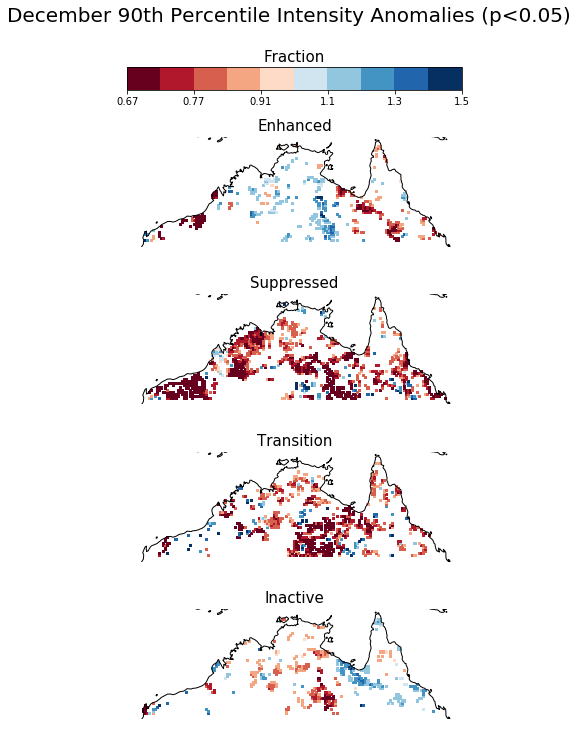

In [173]:
'''Sample Plot'''

subphase_plot = reload(subphase_plot)
month = 12
cbar_title = 'Fraction'
subphase_plot.anomalies_plots(int_anomaly_sig.sel(month = month).precip, vmax = 1.5, cbar_title = cbar_title,
                             title = f'{calendar.month_name[month]} {q}th Percentile Intensity Anomalies (p<0.05)')

In [174]:
'''Saving All Plots'''

subphase_plot = reload(subphase_plot)
for month in [10,11,12,1,2,3]:

    cbar_title = 'Fraction'
    subphase_plot.anomalies_plots(int_anomaly_90_sig.sel(month = month).precip, vmax = 1.5, cbar_title = cbar_title,
                                 title = f'{calendar.month_name[month]} {q}th Percentile Count Anomalies (p<0.05)',
                                 savefig = 1, dont_plot = 1,savedir = savedir + 'int/vanilla/')

saving:October 90th Percentile Count Anomalies (p<0.05)
saving:November 90th Percentile Count Anomalies (p<0.05)
saving:December 90th Percentile Count Anomalies (p<0.05)
saving:January 90th Percentile Count Anomalies (p<0.05)
saving:February 90th Percentile Count Anomalies (p<0.05)
saving:March 90th Percentile Count Anomalies (p<0.05)


### enso

#### Calculation

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Bootstrapping </font></center></div>


* This will be the mean(events in phase)/ mean(events)
* mean(events in phase) = sum(total rainfall each year)/ sum(number of events each year)
* mean(events) = sum(total rainfaill)/ sum(number of events)



In [65]:
int_boot_enso = int_boot_calc( above_q_split_2_sum,above_q_split_2_count,above_q_sum, above_q_count)

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Apllying to Actual Values </font></center></div>


In [66]:
# This is getting the dataset that is just the significant points

subphase_calc = reload(subphase_calc) 
int_anomaly_sig_enso = subphase_calc.sel_sig_all(enso_int_anomalies,int_boot_enso)

In [67]:
int_anomaly_sig_enso

<xarray.Dataset>
Dimensions:  (lat: 49, lon: 149, month: 6, nino: 2, phase: 4)
Coordinates:
  * month    (month) int64 1 2 3 10 11 12
  * nino     (nino) object 'el nino' 'la nina'
  * phase    (phase) object 'enhanced' 'suppressed' 'transition' 'inactive'
  * lon      (lon) float64 113.8 114.0 114.2 114.5 ... 150.0 150.2 150.5 150.8
  * lat      (lat) float64 -23.0 -22.75 -22.5 -22.25 ... -11.5 -11.25 -11.0
Data variables:
    precip   (month, nino, phase, lat, lon) float32 nan 1.1201923 ... nan nan

#### Plot Stippled

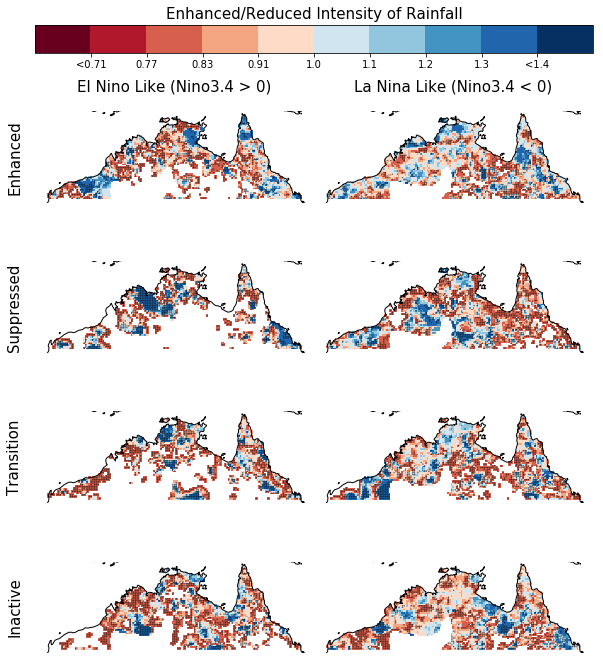

In [342]:

subplot_2 = reload(subplot_2) 

cbar_title = 'Enhanced/Reduced Intensity of Rainfall'
subplot_2.enso_anomalies_plots_stippled(enso_int_anomalies.sel(month = month).precip,
                              int_anomaly_sig_enso.sel(month = month).precip,
                                       cbar_title = cbar_title, vmax = 1.5)
                              

ENSO_Int_95_October has been saved
ENSO_Int_95_November has been saved
ENSO_Int_95_December has been saved
ENSO_Int_95_January has been saved
ENSO_Int_95_February has been saved
ENSO_Int_95_March has been saved


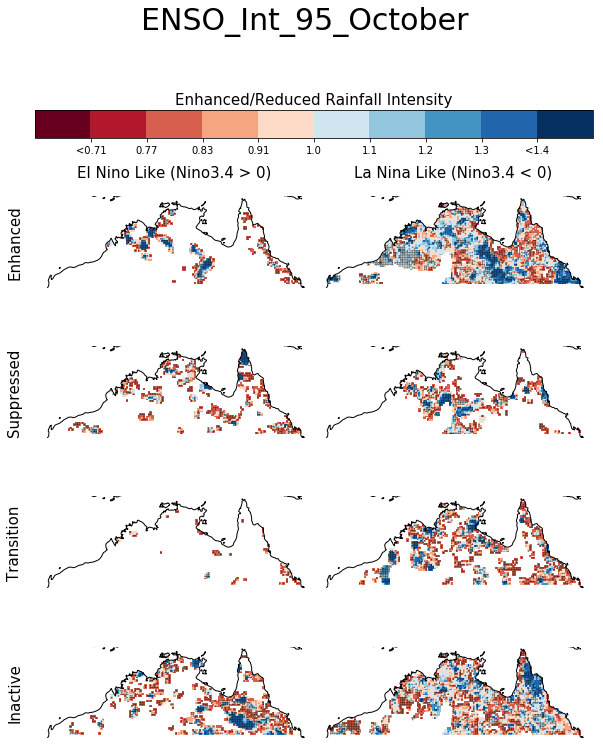

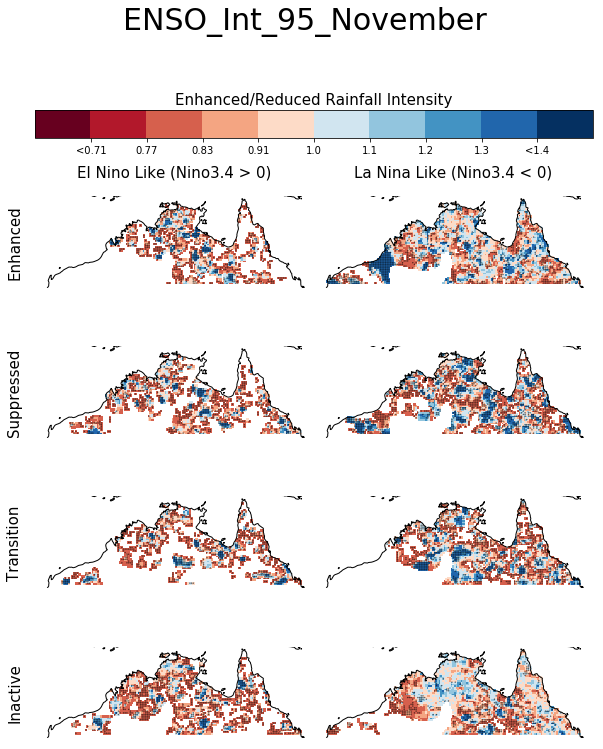

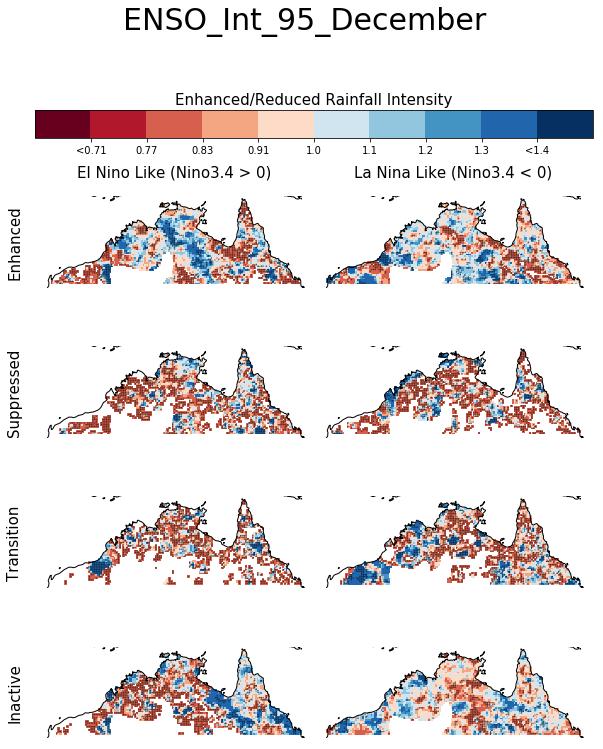

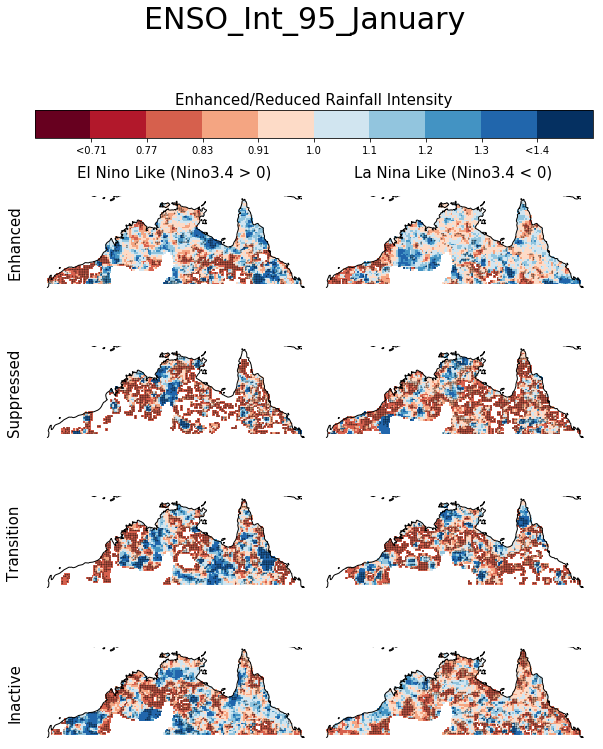

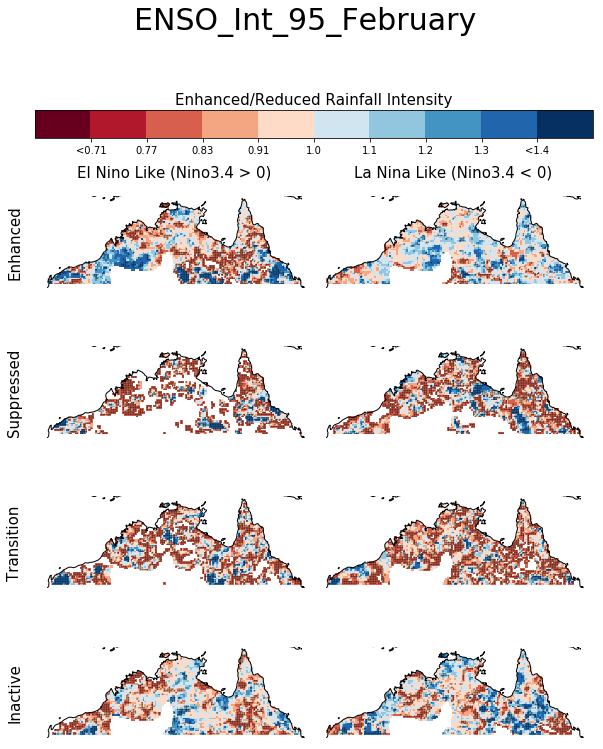

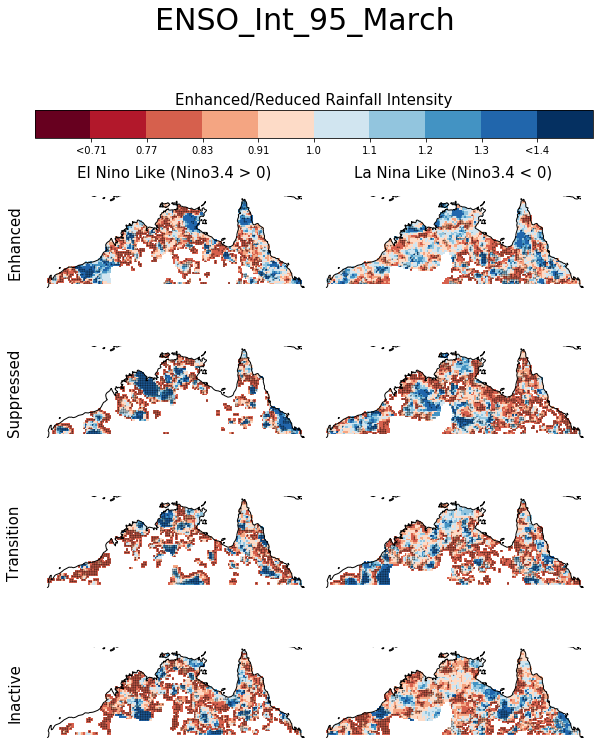

In [343]:

subplot_2 = reload(subplot_2) 

cbar_title = 'Enhanced/Reduced Rainfall Intensity'
for month in [10,11,12,1,2,3]:

    save_name = f'ENSO_Int_95_{calendar.month_name[month]}'
    subplot_2.enso_anomalies_plots_stippled(enso_int_anomalies.sel(month = month).precip,
                                  int_anomaly_sig_enso.sel(month = month).precip,
                                            save_name = save_name,
                                           cbar_title = cbar_title, savedir = savedir2, 
                                           vmax = 1.5)


#### Plot Plain

10_int_95 has been saved
11_int_95 has been saved
12_int_95 has been saved
1_int_95 has been saved
2_int_95 has been saved
3_int_95 has been saved


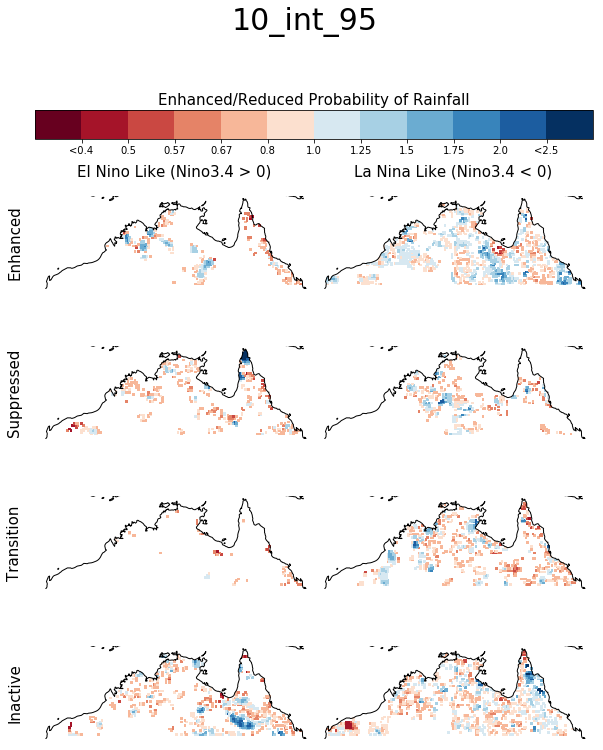

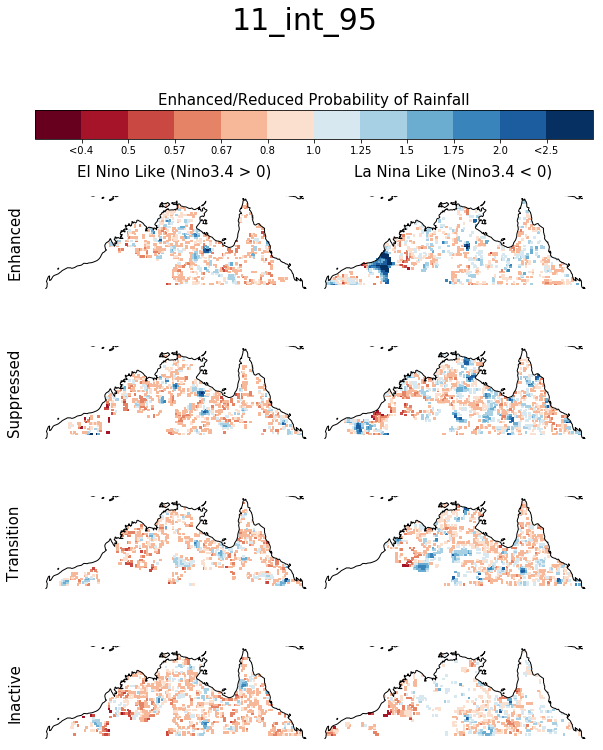

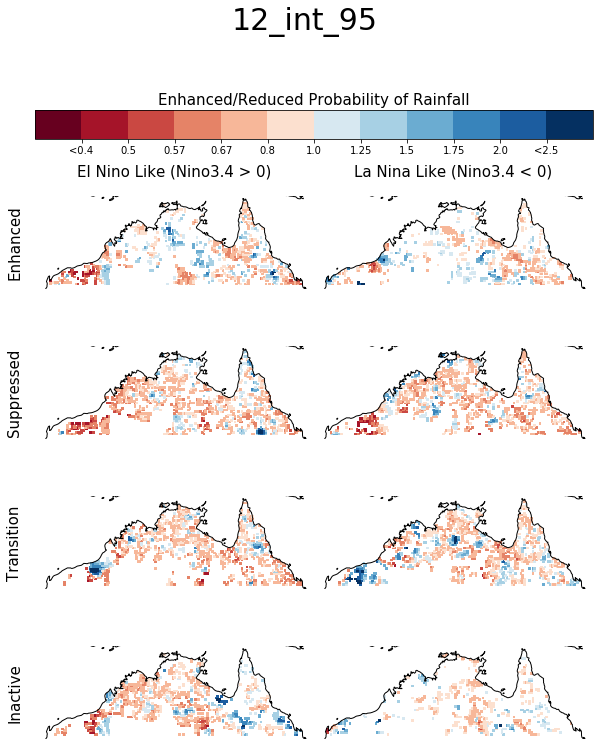

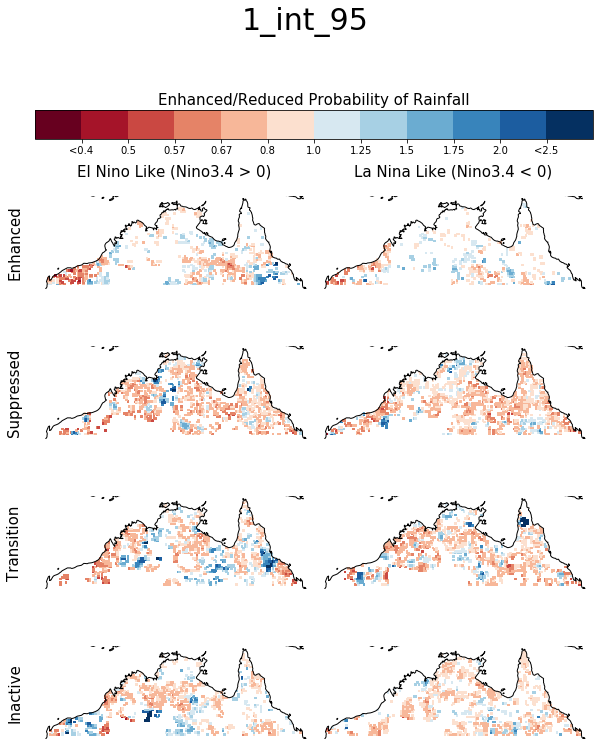

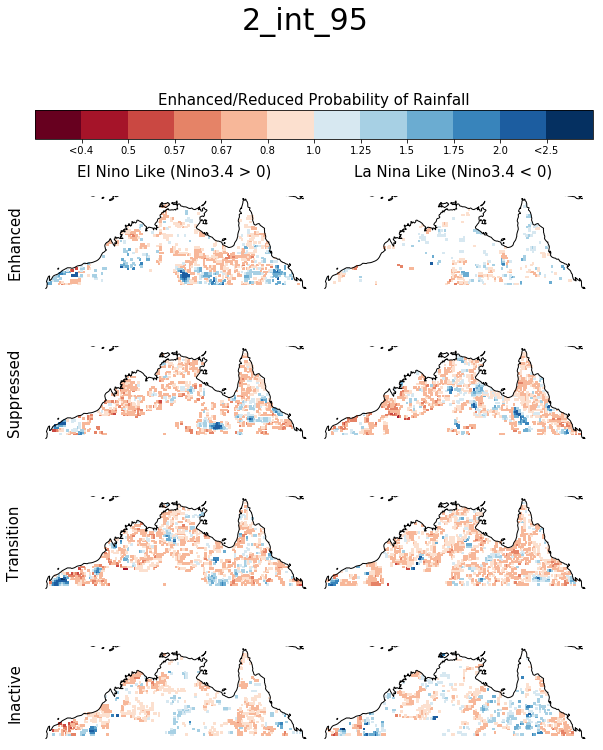

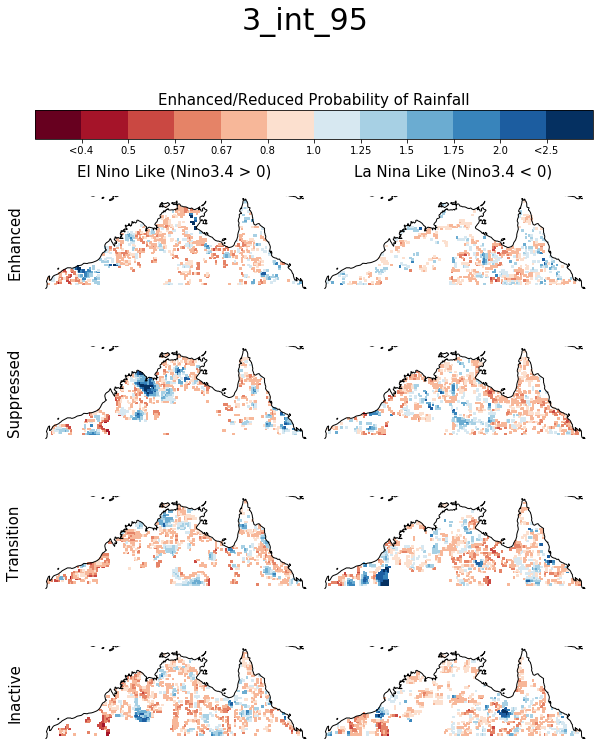

In [80]:
subphase_plot = reload(subphase_plot)
save_int2 = 'anomalies/int/enso/'
for month in [10,11,12,1,2,3]:
    subplot_2.enso_anomalies_plots_stippled(int_anomaly_sig_enso.sel(month = month).precip,
                                       cbar_title = cbar_title,
                                            save_name = f'{month}_int_95',savedir = save_int2)

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Plotting </font></center></div>


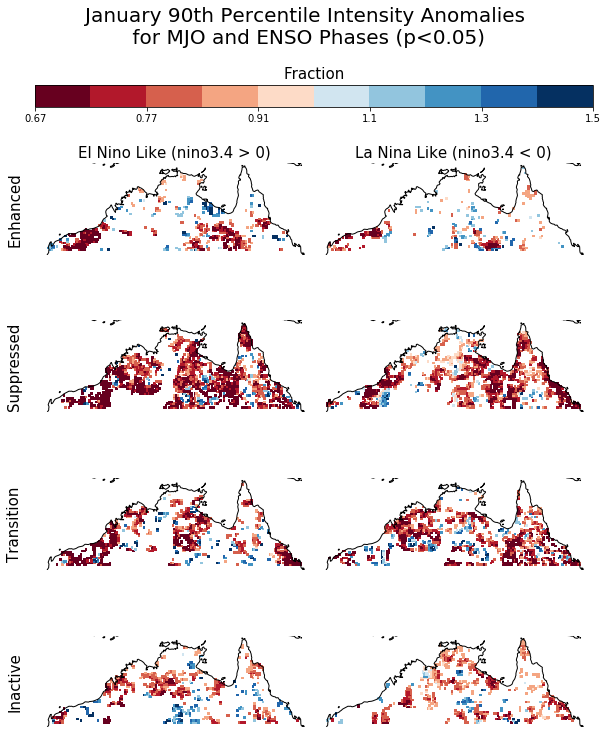

In [178]:
'''Sample Plot'''

subphase_plot = reload(subphase_plot)
month = 1
cbar_title = 'Fraction'
subphase_plot.enso_anomalies_plots(int_anomaly_sig_enso.sel(month = month).precip, vmax = 1.5, cbar_title = cbar_title,
                             title = f'{calendar.month_name[month]} {q}th Percentile Intensity Anomalies\n for MJO and ENSO Phases (p<0.05)')

In [179]:
'''Saving All Plots'''

subphase_plot = reload(subphase_plot)
for month in [10,11,12,1,2,3]:

    cbar_title = 'Fraction'
    title = f'{calendar.month_name[month]} {q}th Percentile Intensity Anomalies\n for MJO and ENSO Phases (p<0.05)'
    subphase_plot.enso_anomalies_plots(int_anomaly_sig_enso.sel(month = month).precip, vmax = 1.5, cbar_title = cbar_title,
                                 title = title,
                                 savefig = 1, dont_plot = 1,savedir = savedir + 'int/enso/')

October 90th Percentile Intensity Anomalies
 for MJO and ENSO Phases (p<0.05) has been save
November 90th Percentile Intensity Anomalies
 for MJO and ENSO Phases (p<0.05) has been save
December 90th Percentile Intensity Anomalies
 for MJO and ENSO Phases (p<0.05) has been save
January 90th Percentile Intensity Anomalies
 for MJO and ENSO Phases (p<0.05) has been save
February 90th Percentile Intensity Anomalies
 for MJO and ENSO Phases (p<0.05) has been save
March 90th Percentile Intensity Anomalies
 for MJO and ENSO Phases (p<0.05) has been save


## Sum

In [64]:
def calc_sum_boot(phase_sum_q, phase_sum_all,sum_q, sum_all ):

    phase_sum_q = phase_sum_q.fillna(0)
    phase_sum_all = phase_sum_all.fillna(0)
    sum_q = sum_q.fillna(0)
    sum_all = sum_all.fillna(0)
    
    
    anomaly_stor_sum = []

    loops = 1000
    for i in range(loops):

        # Initalising
        q_phase = phase_sum_q.isel(year=0).drop('year')*0
        all_phase = phase_sum_all.isel(year=0).drop('year')*0

        q_ = sum_q.isel(year=0).drop('year')*0
        all_ = sum_all.isel(year=0).drop('year')*0

        # Looping through 22 random years
        for y in np.random.randint(1974,2017,22):
            q_phase  += phase_sum_q.sel(year=y).drop('year')
            all_phase += phase_sum_all.sel(year=y).drop('year')

            q_ += sum_q.sel(year=y).drop('year')
            all_ += sum_all.sel(year=y).drop('year')

        # The proportion of events as extreme in each phase
        phase_frac = q_phase/all_phase

        # The overall proportion of events as extremes
        all_frac = q_/ all_

        anomaly = phase_frac/all_frac
        anomaly_stor_sum.append(anomaly)

    total_sum = xr.concat(anomaly_stor_sum, pd.Index(np.arange(loops), name = 'run'))

    p90_sum = total_sum.reduce(np.nanpercentile, q = 90, dim = 'run')

    p10_sum = total_sum.reduce(np.nanpercentile, q = 10, dim = 'run')


    # Concatinating into the one dataset
    sum_boot = xr.concat([p10_sum,p90_sum], pd.Index(['10','90'], name= 'percentile'))

    return sum_boot

### MJO

#### Calculation

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Bootstrapping </font></center></div>


The four datasets to be used here are: 
* phase: phase_sum_q, phase_sum_all 
* non-phase: sum_q, sum_all

In [68]:
# calc_sum_boot(phase_sum_q, phase_sum_all,sum_q, sum_all )

sum_boot = calc_sum_boot(above_q_split_sum, normal_split_sum, above_q_sum , normal_sum)

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Apllying to Actual Values </font></center></div>


In [69]:
# This is getting the dataset that is just the significant points

subphase_calc = reload(subphase_calc) 
sum_anomaly_sig = subphase_calc.sel_sig_all(sum_anomaly,sum_boot)

In [70]:
sum_anomaly_sig

<xarray.Dataset>
Dimensions:  (lat: 49, lon: 149, month: 6, phase: 4)
Coordinates:
  * month    (month) int64 1 2 3 10 11 12
  * lat      (lat) float64 -23.0 -22.75 -22.5 -22.25 ... -11.5 -11.25 -11.0
  * phase    (phase) object 'enhanced' 'suppressed' 'transition' 'inactive'
  * lon      (lon) float64 113.8 114.0 114.2 114.5 ... 150.0 150.2 150.5 150.8
Data variables:
    precip   (month, phase, lat, lon) float32 nan nan nan nan ... nan nan nan

#### Stippled Plot

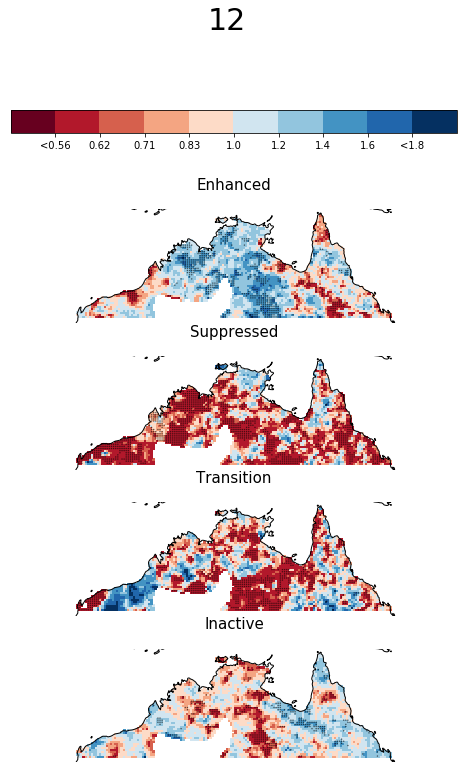

In [340]:
subplot_2 = reload(subplot_2)
month = 12
subplot_2.anomalies_plots_stippled_2(sum_anomaly.sel(month = month).precip,
                                     sum_anomaly_sig.sel(month = month).precip, \
                                    save_name = str(month), vmax = 2)

Prop_95_October has been saved
Prop_95_November has been saved
Prop_95_December has been saved
Prop_95_January has been saved
Prop_95_February has been saved
Prop_95_March has been saved


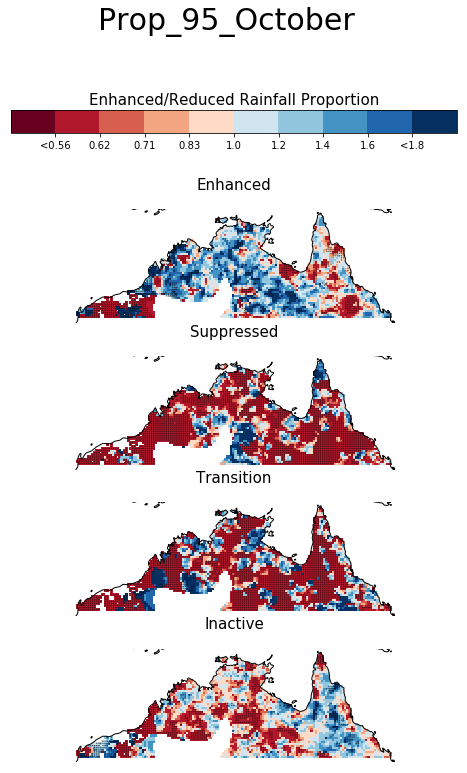

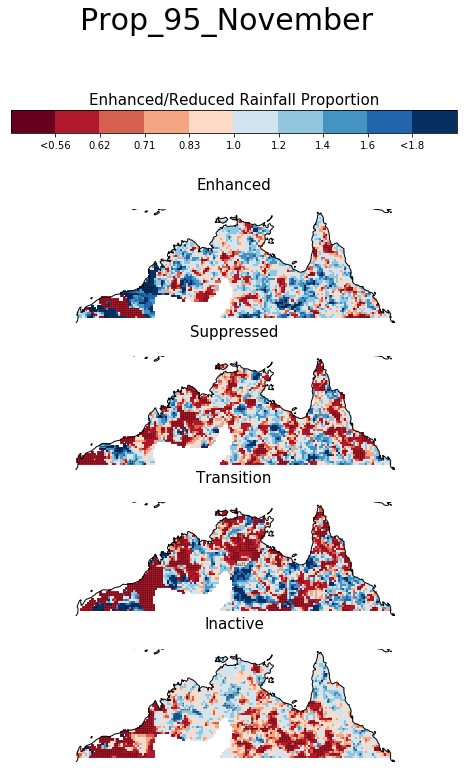

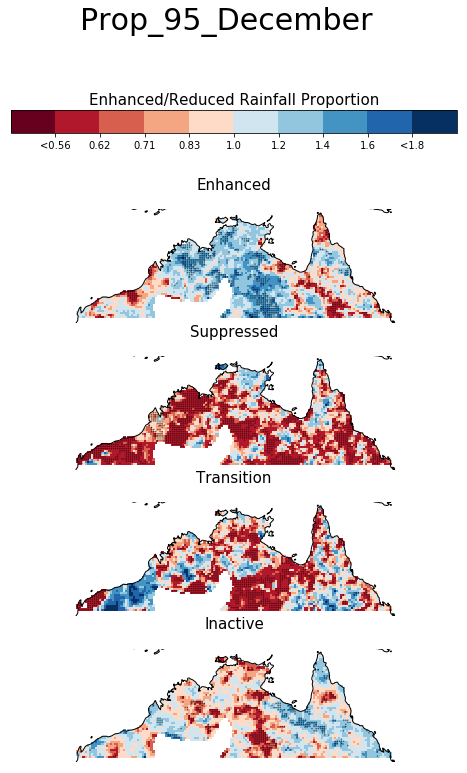

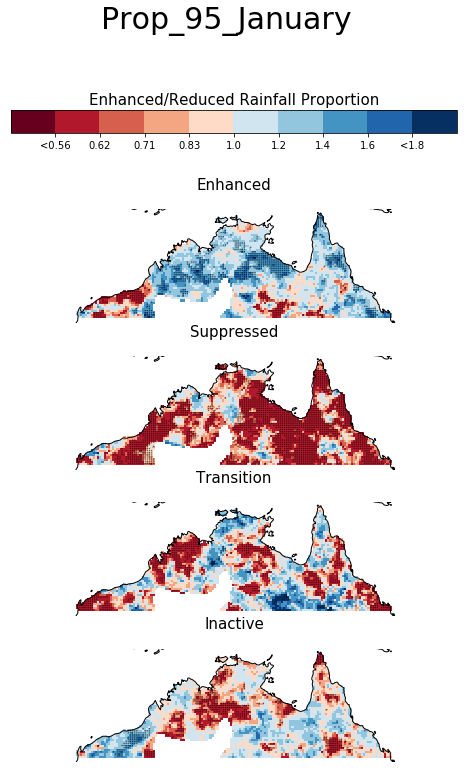

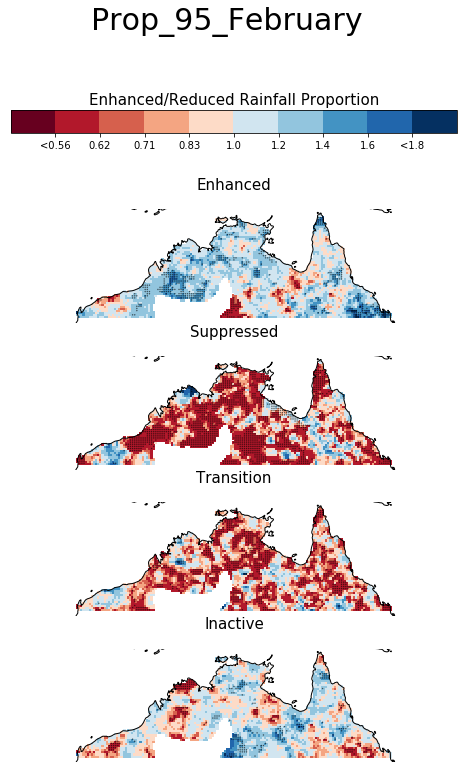

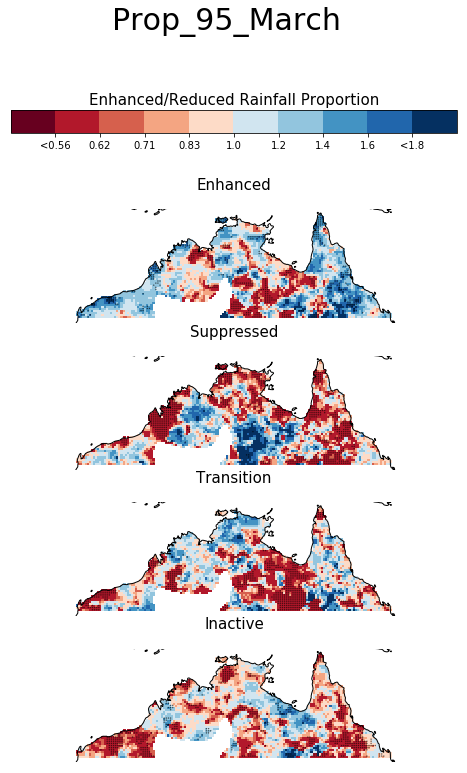

In [341]:
subplot_2 = reload(subplot_2)
cbar_title = 'Enhanced/Reduced Rainfall Proportion'

for month in [10,11,12,1,2,3]:

    save_name = f'Prop_95_{calendar.month_name[month]}'
    
    subplot_2.anomalies_plots_stippled_2(sum_anomaly.sel(month = month).precip,
                                         sum_anomaly_sig.sel(month = month).precip, \
                                        save_name =  save_name, vmax = 2, 
                                         cbar_title = cbar_title, savedir = savedir3)

#### Plain Plot

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Plotting </font></center></div>


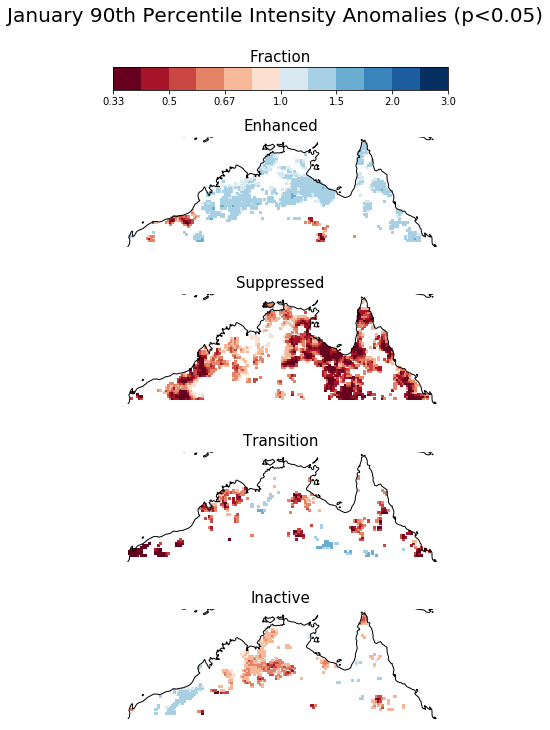

In [33]:
'''Sample Plot'''

subphase_plot = reload(subphase_plot)
month = 1
cbar_title = 'Fraction'
subphase_plot.anomalies_plots(sum_anomaly_sig.sel(month = month).precip, vmax = 3, cbar_title = cbar_title,
                             title = f'{calendar.month_name[month]} {q}th Percentile Intensity Anomalies\n for MJO Phases (p<0.05)')

In [35]:
'''Saving All Plots'''

subphase_plot = reload(subphase_plot)
for month in [10,11,12,1,2,3]:

    cbar_title = 'Fraction'
    title =  f'{calendar.month_name[month]} Proportion Anomalies {q}th Percentile (p<0.05) for MJO Phases'
    subphase_plot.anomalies_plots(sum_anomaly_90_sig.sel(month = month).precip, vmax = 1.5, cbar_title = cbar_title,
                                 title  = title,
                                 savefig = 1, dont_plot = 1,savedir = savedir + 'sum/mjo and enso/')

saving:October Proportion Anomalies 90th Percentile (p<0.05) for MJO Phases
saving:November Proportion Anomalies 90th Percentile (p<0.05) for MJO Phases
saving:December Proportion Anomalies 90th Percentile (p<0.05) for MJO Phases
saving:January Proportion Anomalies 90th Percentile (p<0.05) for MJO Phases
saving:February Proportion Anomalies 90th Percentile (p<0.05) for MJO Phases
saving:March Proportion Anomalies 90th Percentile (p<0.05) for MJO Phases


### MJO and ENSO

#### Calculation

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Bootstrapping </font></center></div>


The four datasets to be used here are: 
* phase: phase_sum_q, phase_sum_all 
* non-phase: sum_q, sum_all

In [71]:
# calc_sum_boot(phase_sum_q, phase_sum_all,sum_q, sum_all )

sum_boot_enso = calc_sum_boot(above_q_split_2_sum, normal_split_2_sum, above_q_sum , normal_sum)

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Apllying to Actual Values </font></center></div>


In [72]:
# This is getting the dataset that is just the significant points

subphase_calc = reload(subphase_calc) 
sum_anomaly_sig_enso = subphase_calc.sel_sig_all(enso_sum_anomalies,sum_boot_enso)

In [73]:
sum_anomaly_sig_enso

<xarray.Dataset>
Dimensions:  (lat: 49, lon: 149, month: 6, nino: 2, phase: 4)
Coordinates:
  * month    (month) int64 1 2 3 10 11 12
  * nino     (nino) object 'el nino' 'la nina'
  * phase    (phase) object 'enhanced' 'suppressed' 'transition' 'inactive'
  * lon      (lon) float64 113.8 114.0 114.2 114.5 ... 150.0 150.2 150.5 150.8
  * lat      (lat) float64 -23.0 -22.75 -22.5 -22.25 ... -11.5 -11.25 -11.0
Data variables:
    precip   (month, nino, phase, lat, lon) float32 nan nan nan ... nan nan nan

#### Stippled Plot

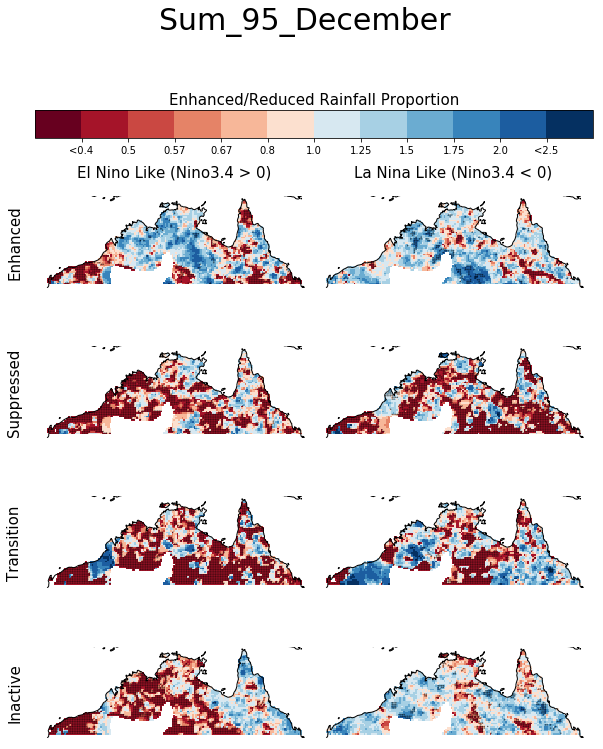

In [335]:

subplot_2 = reload(subplot_2) 

cbar_title = 'Enhanced/Reduced Rainfall Proportion'
month = 12

save_name = f'Sum_95_{calendar.month_name[month]}'
subplot_2.enso_anomalies_plots_stippled(enso_sum_anomalies.sel(month = month).precip,
                              sum_anomaly_sig_enso.sel(month = month).precip,
                                        save_name = save_name,
                                       cbar_title = cbar_title)

ENSO_Prop_95_October has been saved
ENSO_Prop_95_November has been saved
ENSO_Prop_95_December has been saved
ENSO_Prop_95_January has been saved
ENSO_Prop_95_February has been saved
ENSO_Prop_95_March has been saved


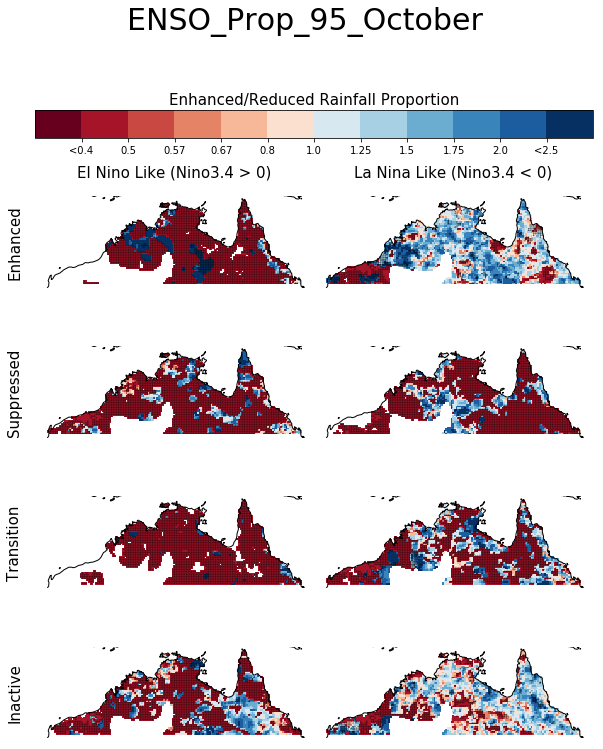

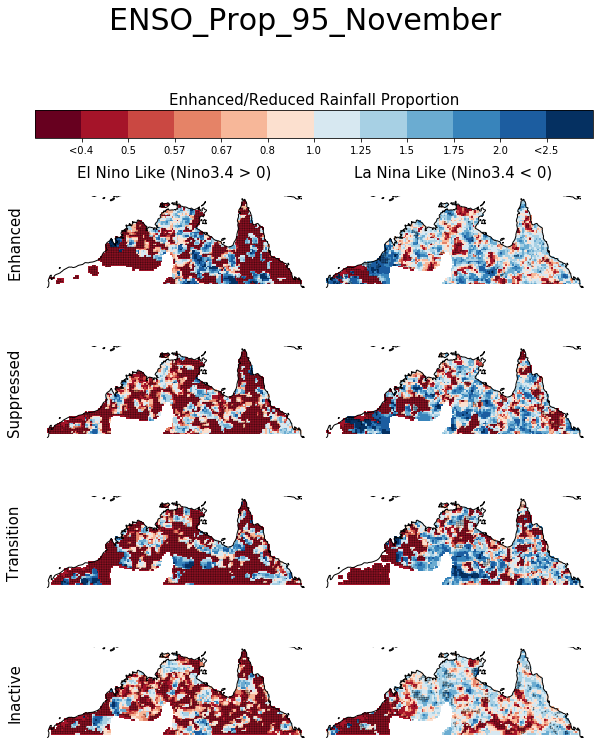

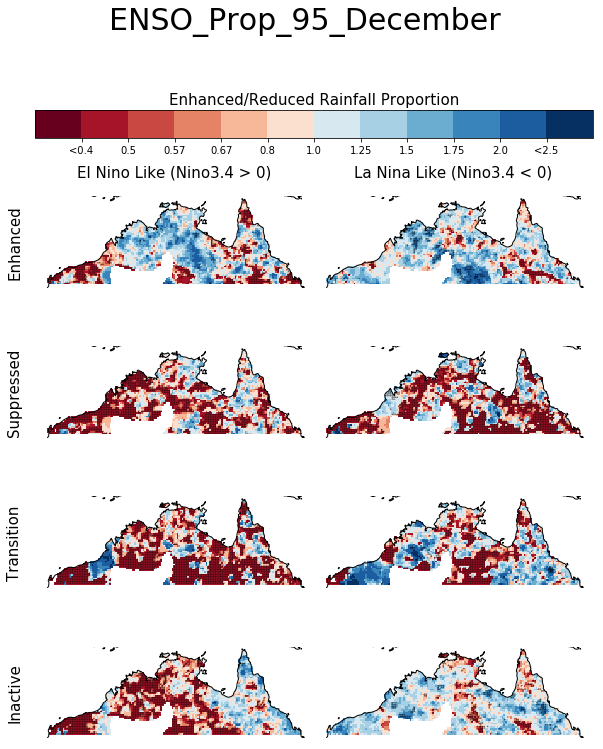

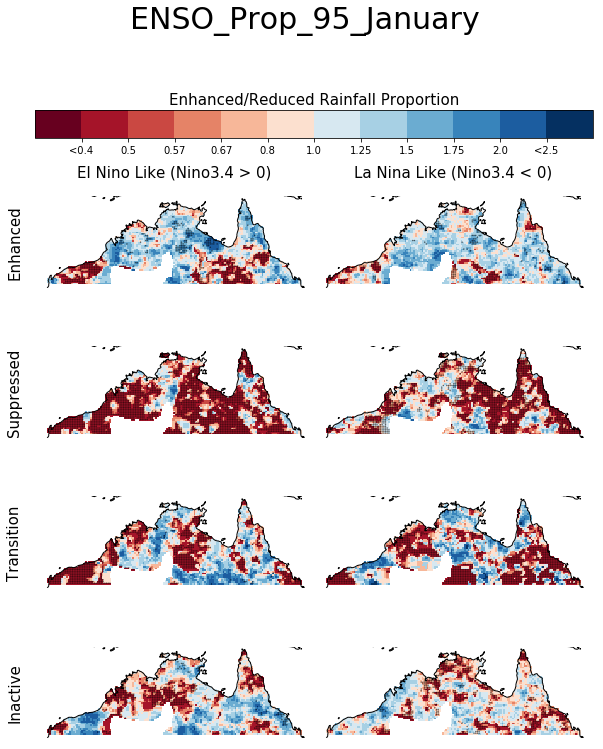

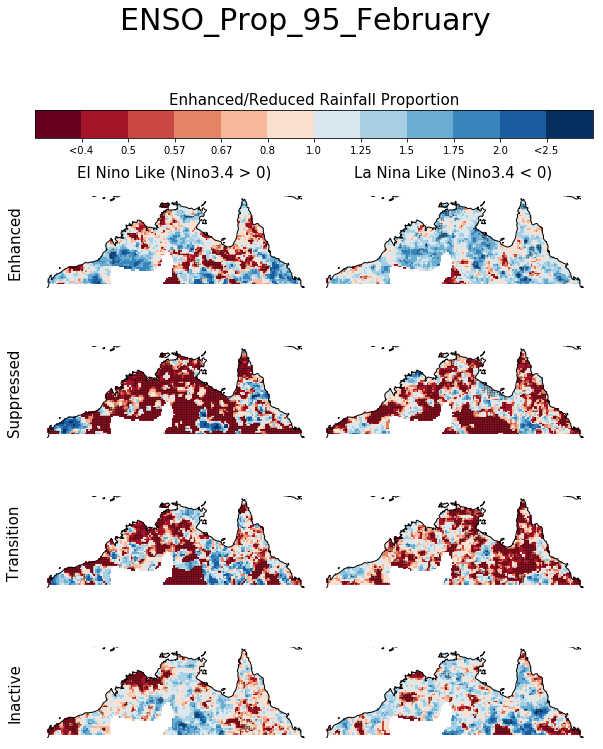

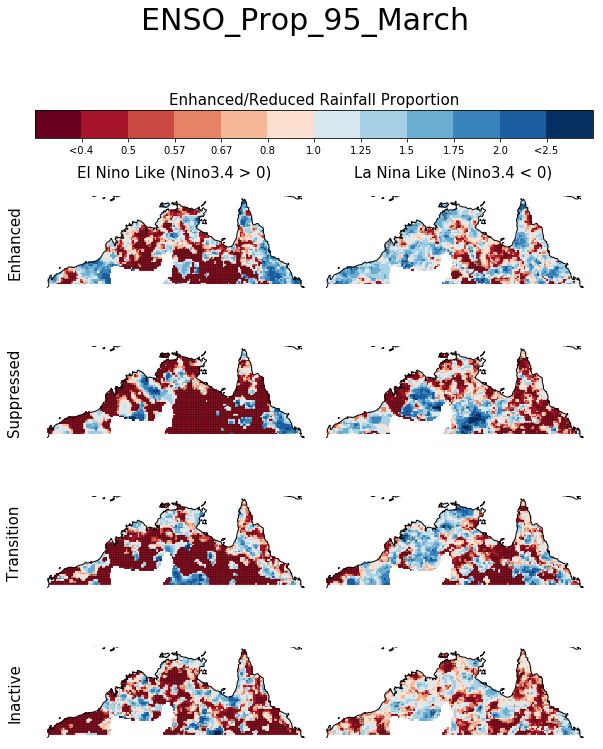

In [336]:

subplot_2 = reload(subplot_2) 

cbar_title = 'Enhanced/Reduced Rainfall Proportion'
for month in [10,11,12,1,2,3]:

    save_name = f'ENSO_Prop_95_{calendar.month_name[month]}'
    subplot_2.enso_anomalies_plots_stippled(enso_sum_anomalies.sel(month = month).precip,
                                  sum_anomaly_sig_enso.sel(month = month).precip,
                                            save_name = save_name,
                                           cbar_title = cbar_title, savedir = savedir3)

#### Plain Plot

10_sum_95 has been saved
11_sum_95 has been saved
12_sum_95 has been saved
1_sum_95 has been saved
2_sum_95 has been saved
3_sum_95 has been saved


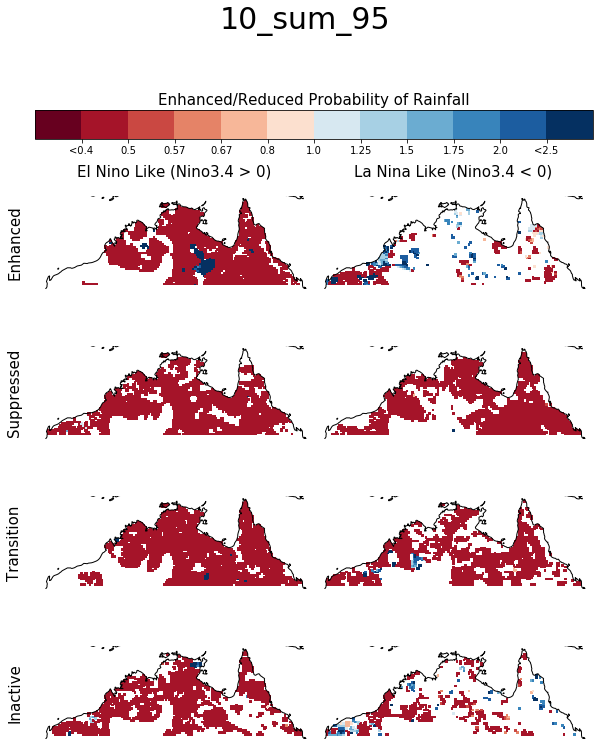

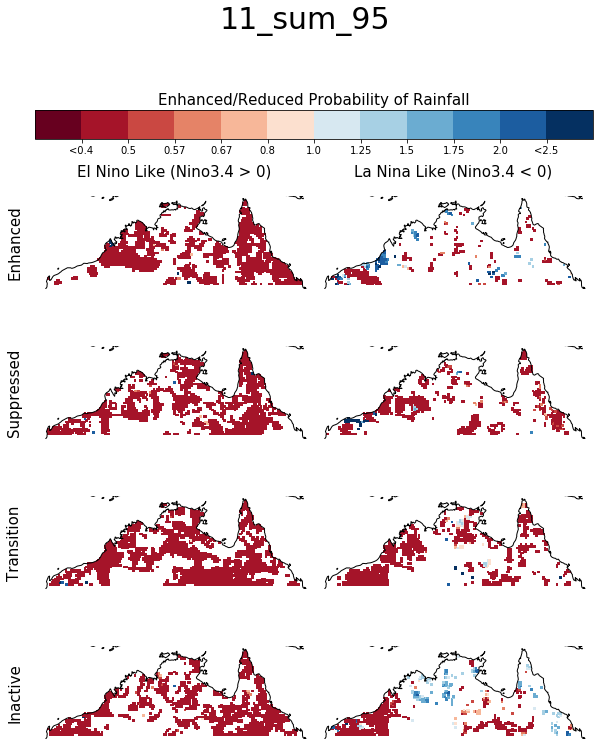

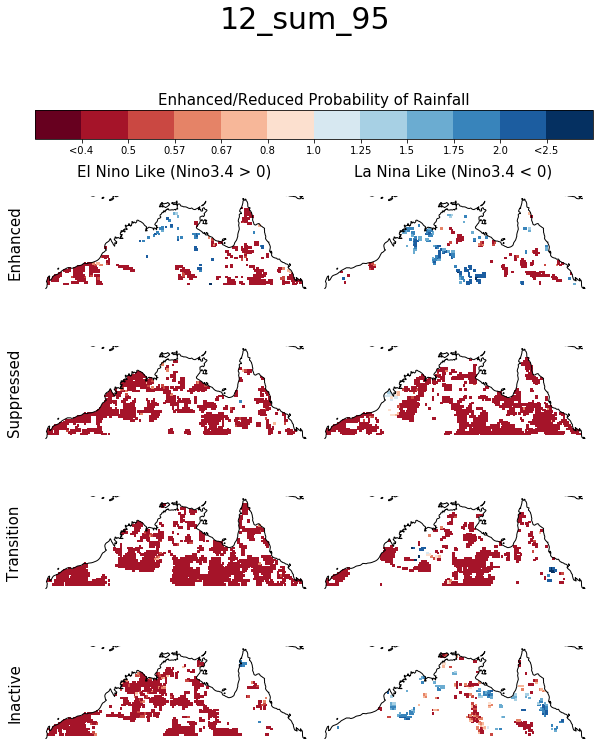

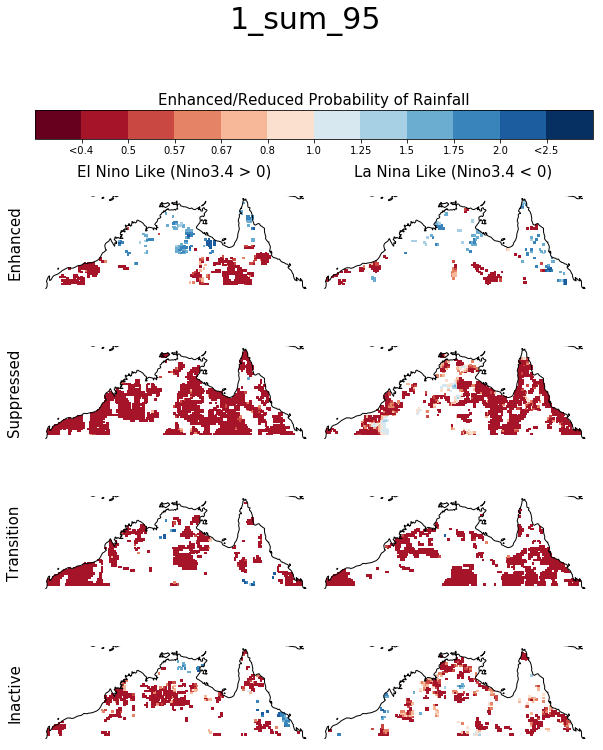

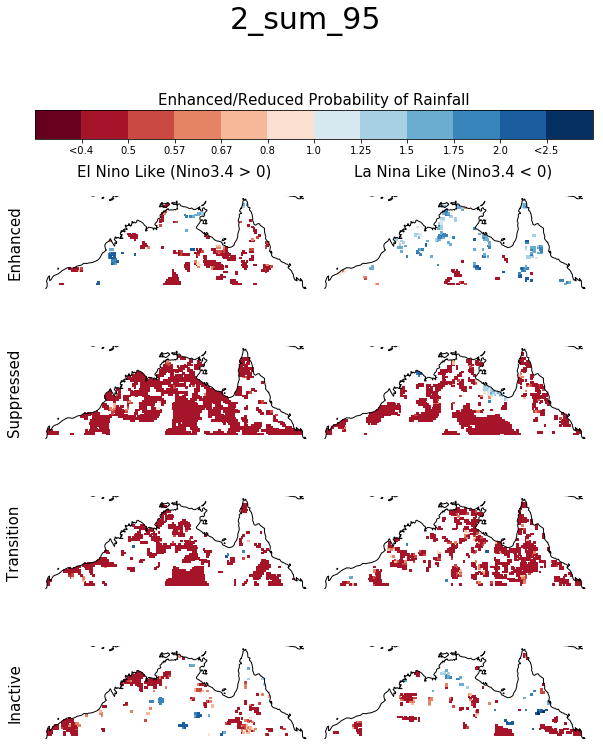

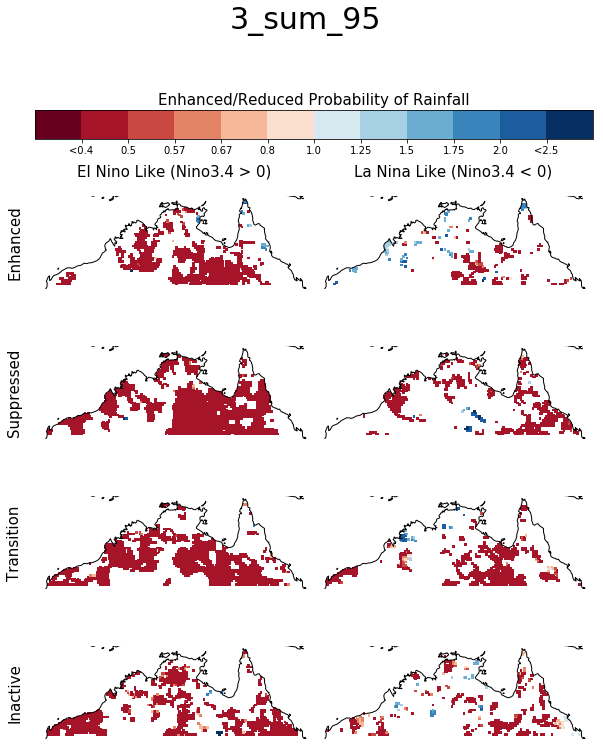

In [81]:
subphase_plot = reload(subphase_plot)
save_sum2 = 'anomalies/proportion/enso/'
for month in [10,11,12,1,2,3]:
    subplot_2.enso_anomalies_plots_stippled(sum_anomaly_sig_enso.sel(month = month).precip,
                                       cbar_title = cbar_title,
                                            save_name = f'{month}_sum_95',savedir = save_sum2)

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Plotting </font></center></div>


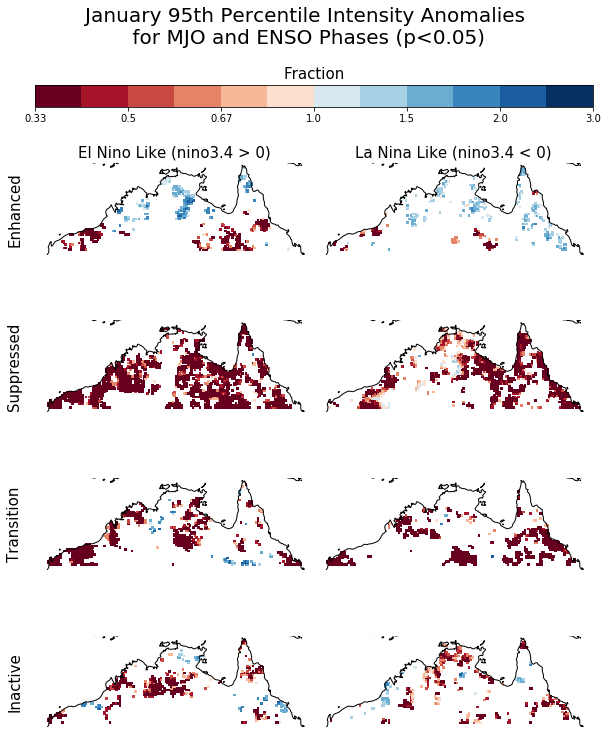

In [49]:
'''Sample Plot'''

subphase_plot = reload(subphase_plot)
month = 1
cbar_title = 'Fraction'
subphase_plot.enso_anomalies_plots(sum_anomaly_sig_enso.sel(month = month).precip, vmax = 3, cbar_title = cbar_title,
                             title = f'{calendar.month_name[month]} {q}th Percentile Intensity Anomalies\n for MJO and ENSO Phases (p<0.05)')

In [50]:
'''Saving All Plots'''

subphase_plot = reload(subphase_plot)
for month in [10,11,12,1,2,3]:

    cbar_title = 'Fraction'
    title =  f'{calendar.month_name[month]} Proportion Anomalies {q}th Percentile (p<0.05) for MJO and ENSO Phases'
    subphase_plot.anomalies_plots(sum_anomaly_90_sig.sel(month = month).precip, vmax = 1.5, cbar_title = cbar_title,
                                 title  = title,
                                 savefig = 1, dont_plot = 1,savedir = savedir + 'sum/mjo and enso/')

saving:October Proportion Anomalies 95th Percentile (p<0.05) for MJO and ENSO Phases
saving:November Proportion Anomalies 95th Percentile (p<0.05) for MJO and ENSO Phases
saving:December Proportion Anomalies 95th Percentile (p<0.05) for MJO and ENSO Phases
saving:January Proportion Anomalies 95th Percentile (p<0.05) for MJO and ENSO Phases
saving:February Proportion Anomalies 95th Percentile (p<0.05) for MJO and ENSO Phases
saving:March Proportion Anomalies 95th Percentile (p<0.05) for MJO and ENSO Phases


# Total Combined

## All Calculation

### Anomalies

In [9]:
q = 50

In [10]:
'''Count'''

raw = awap.precip
split = awap_split.precip



subphase_calc = reload(subphase_calc) 
count_anomaly = subphase_calc.count_anomalies(raw, split, q)

subphase_calc = reload(subphase_calc)
enso_count_anomalies = subphase_calc.enso_count_anomalies(awap, q,nino34, rmm)

'''Intensity'''

raw = awap.precip
split = awap_split.precip



subphase_calc = reload(subphase_calc) 
int_anomaly = subphase_calc.int_anomalies(raw, split, q)

subphase_calc = reload(subphase_calc)


enso_int_anomalies = subphase_calc.enso_int_anomalies(awap, q,nino34, rmm)

'''Proportion'''

raw = awap.precip
split = awap_split.precip



subphase_calc = reload(subphase_calc) 
sum_anomaly = subphase_calc.sum_anomalies(raw, split, q)


subphase_calc = reload(subphase_calc)

enso_sum_anomalies = subphase_calc.enso_sum_anomalies(awap, q,nino34, rmm)

### Bootstrapping

#### Datasets

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Rainfall Datasets </font></center></div>


In [11]:


subphase_calc = reload(subphase_calc)
'''Extremes (above qth percentile events)'''
# The events above the percentile
above_q = subphase_calc.unsplit_find_events_above_q(awap, q)
# MJO splitting
above_q_split  = subphase_calc.split_into_subphase(above_q, rmm)

# ENSO splitting
above_q_split_2  = subphase_calc.split_into_enso(above_q_split, nino34)


'''All events'''
# MJO splitting
normal_split  = subphase_calc.split_into_subphase(awap, rmm)

# ENSO splitting
nomral_split_2  = subphase_calc.split_into_enso(normal_split, nino34)


<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Resampled Datasets </font></center></div>


All of these data set are resamled to do either a count or a sum for each year and each sub-group (mjo phase and also month). This helps with making the bootstrapping faster

Extremes

In [12]:
# No Phase This is for the climatology (I guess), the count and also the sum of rainfall

subphase_calc = reload(subphase_calc)
above_q_count, above_q_sum = subphase_calc.year_resmaples(above_q)

# MJO Split

subphase_calc = reload(subphase_calc)
above_q_split_count, above_q_split_sum = subphase_calc.year_resmaples(above_q_split)

# ENSO and MJO split

subphase_calc = reload(subphase_calc)
above_q_split_2_count, above_q_split_2_sum = subphase_calc.year_resmaples(above_q_split_2)

Normal Events

In [13]:
# No Phase

subphase_calc = reload(subphase_calc)
normal_count, normal_sum = subphase_calc.year_resmaples(awap)

# MJO Split

subphase_calc = reload(subphase_calc)
normal_split_count, normal_split_sum = subphase_calc.year_resmaples(normal_split)

# ENSO and MJO split

subphase_calc = reload(subphase_calc)
normal_split_2_count, normal_split_2_sum = subphase_calc.year_resmaples(nomral_split_2)

In [14]:
def count_bootstrap(extreme, normal, loops = 1000):
    
    
    extreme = extreme.fillna(0)
    normal = normal.fillna(0)
    
    per = (100 - q)/100
    anomaly_stor = []

    for i in range(loops):

        # Initalising
        extreme_sum = extreme.isel(year=0).drop('year')*0
        normal_sum = normal.isel(year=0).drop('year')*0

        # Looping through 22 random years
        for y in np.random.randint(1974,2017,22):

            # This will return the sum of all the counts,whcih will be the total count
            extreme_sum += extreme.sel(year=y).drop('year')
            normal_sum += normal.sel(year=y).drop('year')


        anomaly = (extreme_sum/normal_sum)/per
        anomaly_stor.append(anomaly)
    
    # Putting all of the runs into the one xarray file
    total_count = xr.concat(anomaly_stor, pd.Index(np.arange(loops), name = 'run'))
    
    # Calculating the 90th and 10th percentile of all runs
    p90_count = total_count.reduce(np.nanpercentile, q = 90, dim = 'run')

    p10_count = total_count.reduce(np.nanpercentile, q = 10, dim = 'run')


    # Concatinating into the one dataset
    count_boot = xr.concat([p10_count,p90_count], pd.Index(['10','90'], name= 'percentile'))


    return count_boot

def int_boot_calc(phase_sum_q,phase_count_q ,all_sum_q ,all_count_q ):
    
    phase_count_q = phase_count_q.fillna(0)
    phase_sum_q = phase_sum_q.fillna(0)
    all_sum_q = all_sum_q.fillna(0)
    all_count_q = all_count_q.fillna(0)
    
    
    anomaly_stor_int = []

    loops = 1000
    for i in range(loops):

        # Initalising
        phase_sum = phase_sum_q.isel(year=0).drop('year')*0
        phase_count = phase_count_q.isel(year=0).drop('year')*0

        all_sum = all_sum_q.isel(year=0).drop('year')*0
        all_count = all_count_q.isel(year=0).drop('year')*0

        # Looping through 22 random years
        for y in np.random.randint(1974,2017,22):
            # The sum of sums, this will be the numertor for the mean fraction
            phase_sum += phase_sum_q.sel(year=y).drop('year')
            phase_count += phase_count_q.sel(year=y).drop('year')

            all_sum += all_sum_q.sel(year=y).drop('year')
            all_count += all_count_q.sel(year=y).drop('year')
        
        # Thsi is the phase mean
        phase_mean = phase_sum/phase_count
        
        # This is the overall mean
        all_mean = all_sum/ all_count

        anomaly = phase_mean/all_mean
        anomaly_stor_int.append(anomaly)

    total_int = xr.concat(anomaly_stor_int, pd.Index(np.arange(loops), name = 'run'))

    p90_int = total_int.reduce(np.nanpercentile, q = 90, dim = 'run')

    p10_int = total_int.reduce(np.nanpercentile, q = 10, dim = 'run')


    # Concatinating into the one dataset
    int_boot = xr.concat([p10_int,p90_int], pd.Index(['10','90'], name= 'percentile'))


    return int_boot

def calc_sum_boot(phase_sum_q, phase_sum_all,sum_q, sum_all ):

    phase_sum_q = phase_sum_q.fillna(0)
    phase_sum_all = phase_sum_all.fillna(0)
    sum_q = sum_q.fillna(0)
    sum_all = sum_all.fillna(0)
    
    
    anomaly_stor_sum = []

    loops = 1000
    for i in range(loops):

        # Initalising
        q_phase = phase_sum_q.isel(year=0).drop('year')*0
        all_phase = phase_sum_all.isel(year=0).drop('year')*0

        q_ = sum_q.isel(year=0).drop('year')*0
        all_ = sum_all.isel(year=0).drop('year')*0

        # Looping through 22 random years
        for y in np.random.randint(1974,2017,22):
            q_phase  += phase_sum_q.sel(year=y).drop('year')
            all_phase += phase_sum_all.sel(year=y).drop('year')

            q_ += sum_q.sel(year=y).drop('year')
            all_ += sum_all.sel(year=y).drop('year')

        # The proportion of events as extreme in each phase
        phase_frac = q_phase/all_phase

        # The overall proportion of events as extremes
        all_frac = q_/ all_

        anomaly = phase_frac/all_frac
        anomaly_stor_sum.append(anomaly)

    total_sum = xr.concat(anomaly_stor_sum, pd.Index(np.arange(loops), name = 'run'))

    p90_sum = total_sum.reduce(np.nanpercentile, q = 90, dim = 'run')

    p10_sum = total_sum.reduce(np.nanpercentile, q = 10, dim = 'run')


    # Concatinating into the one dataset
    sum_boot = xr.concat([p10_sum,p90_sum], pd.Index(['10','90'], name= 'percentile'))

    return sum_boot

#### MJO

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Count</font></center></div>


In [15]:
count_boot_mjo = count_bootstrap(above_q_split_count, normal_split_count)

# This is getting the dataset that is just the significant points


subphase_calc = reload(subphase_calc) 
count_anomaly_sig = subphase_calc.sel_sig_all(count_anomaly,count_boot_mjo)

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Intensity</font></center></div>


* This will be the mean(events in phase)/ mean(events)
* mean(events in phase) = sum(total rainfall each year)/ sum(number of events each year)
* mean(events) = sum(total rainfaill)/ sum(number of events)



In [16]:
int_boot = int_boot_calc( above_q_split_sum,above_q_split_count,above_q_sum, above_q_count)

# This is getting the dataset that is just the significant points

subphase_calc = reload(subphase_calc) 
int_anomaly_sig = subphase_calc.sel_sig_all(int_anomaly,int_boot)

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Proportion </font></center></div>


The four datasets to be used here are: 
* phase: phase_sum_q, phase_sum_all 
* non-phase: sum_q, sum_all

In [17]:
# calc_sum_boot(phase_sum_q, phase_sum_all,sum_q, sum_all )

sum_boot = calc_sum_boot(above_q_split_sum, normal_split_sum, above_q_sum , normal_sum)

# This is getting the dataset that is just the significant points

subphase_calc = reload(subphase_calc) 
sum_anomaly_sig = subphase_calc.sel_sig_all(sum_anomaly,sum_boot)

#### ENSO

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5">Count</font></center></div>


Actual Bootstrapping Code

In [18]:
count_boot_enso = count_bootstrap(above_q_split_2_count, normal_split_2_count)

In [19]:
# This is getting the dataset that is just the significant points

subphase_calc = reload(subphase_calc) 
count_anomaly_sig_enso = subphase_calc.sel_sig_all(enso_count_anomalies,count_boot_enso)

In [20]:
count_anomaly_sig_enso

<xarray.Dataset>
Dimensions:  (lat: 49, lon: 149, month: 6, nino: 2, phase: 4)
Coordinates:
  * month    (month) int64 1 2 3 10 11 12
  * nino     (nino) object 'el nino' 'la nina'
  * lat      (lat) float64 -23.0 -22.75 -22.5 -22.25 ... -11.5 -11.25 -11.0
  * lon      (lon) float64 113.8 114.0 114.2 114.5 ... 150.0 150.2 150.5 150.8
  * phase    (phase) object 'enhanced' 'suppressed' 'transition' 'inactive'
Data variables:
    precip   (month, nino, phase, lat, lon) float64 nan nan nan ... nan nan nan

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Intensity </font></center></div>


* This will be the mean(events in phase)/ mean(events)
* mean(events in phase) = sum(total rainfall each year)/ sum(number of events each year)
* mean(events) = sum(total rainfaill)/ sum(number of events)



In [21]:
int_boot_enso = int_boot_calc( above_q_split_2_sum,above_q_split_2_count,above_q_sum, above_q_count)

In [22]:
# This is getting the dataset that is just the significant points

subphase_calc = reload(subphase_calc) 
int_anomaly_sig_enso = subphase_calc.sel_sig_all(enso_int_anomalies,int_boot_enso)

In [23]:
int_anomaly_sig_enso

<xarray.Dataset>
Dimensions:  (lat: 49, lon: 149, month: 6, nino: 2, phase: 4)
Coordinates:
  * month    (month) int64 1 2 3 10 11 12
  * lat      (lat) float64 -23.0 -22.75 -22.5 -22.25 ... -11.5 -11.25 -11.0
  * lon      (lon) float64 113.8 114.0 114.2 114.5 ... 150.0 150.2 150.5 150.8
  * phase    (phase) object 'enhanced' 'suppressed' 'transition' 'inactive'
  * nino     (nino) object 'el nino' 'la nina'
Data variables:
    precip   (month, nino, phase, lat, lon) float32 nan nan nan ... nan nan nan

<div class="alert alert-block alert-info"> <center> <font color = 'black' size = "+1.5"> Proportion </font></center></div>


The four datasets to be used here are: 
* phase: phase_sum_q, phase_sum_all 
* non-phase: sum_q, sum_all

In [24]:
# calc_sum_boot(phase_sum_q, phase_sum_all,sum_q, sum_all )

sum_boot_enso = calc_sum_boot(above_q_split_2_sum, normal_split_2_sum, above_q_sum , normal_sum)

In [25]:
# This is getting the dataset that is just the significant points

subphase_calc = reload(subphase_calc) 
sum_anomaly_sig_enso = subphase_calc.sel_sig_all(enso_sum_anomalies,sum_boot_enso)

In [26]:
sum_anomaly_sig_enso

<xarray.Dataset>
Dimensions:  (lat: 49, lon: 149, month: 6, nino: 2, phase: 4)
Coordinates:
  * month    (month) int64 1 2 3 10 11 12
  * lat      (lat) float64 -23.0 -22.75 -22.5 -22.25 ... -11.5 -11.25 -11.0
  * lon      (lon) float64 113.8 114.0 114.2 114.5 ... 150.0 150.2 150.5 150.8
  * phase    (phase) object 'enhanced' 'suppressed' 'transition' 'inactive'
  * nino     (nino) object 'el nino' 'la nina'
Data variables:
    precip   (month, nino, phase, lat, lon) float32 nan nan nan ... nan nan nan

## Plotting MJO

In [29]:
savedir = '../images_2/anomalies/'

In [30]:
import subphase_plot_functions_2 as subplot_2

1_count_95 has been saved


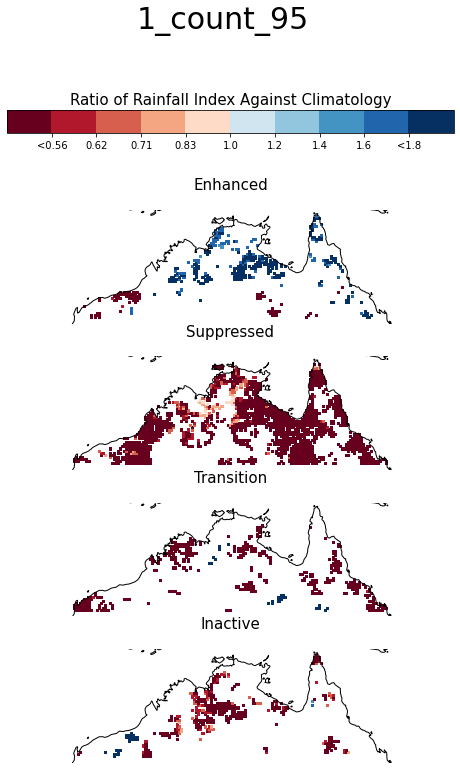

In [40]:
month = 1
subplot_2.anomalies_plots_plain(count_anomaly_sig.sel(month = month).precip, 
                                cbar_title = 'Ratio of Rainfall Index Against Climatology', 
                               save_name = f'{month}_count_{q}', vmax = 2
#                                )
                                , savedir = savedir)

In [ ]:
subplot_2 = reload(subplot_2)
month = 1
save_name = 'test_plot_1_yes_smooth'
subplot_2.anomalies_plots_stippled_2(count_anomaly.sel(month = month).precip,
                                     count_anomaly_sig.sel(month = month).precip, \
                                     add_white = 0, extender = 1, sig_size = 2.5,
                                    save_name = save_name + str(month))
#                                      , savedir = 'test_plots/')

## Plottting ENSO

In [29]:
import subphase_plot_functions_2 as subplot_2

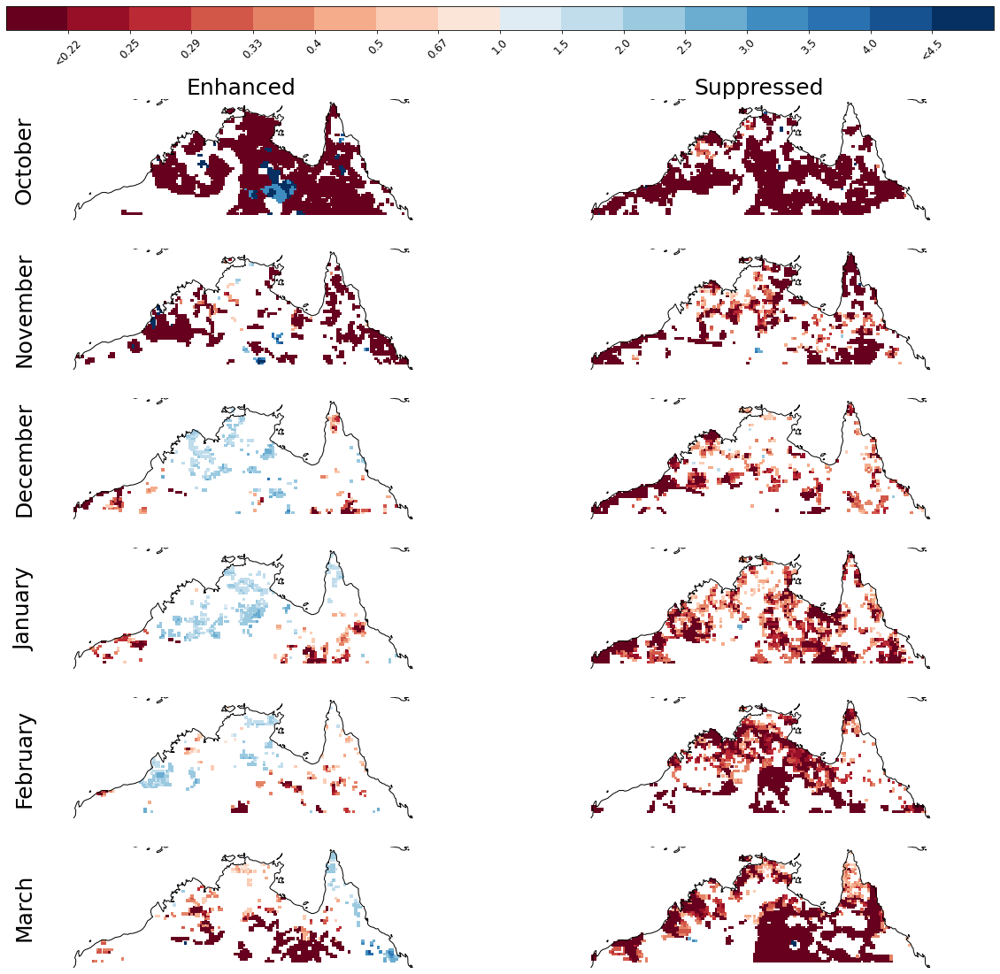

In [30]:
subplot_2 = reload(subplot_2)
subplot_2.anomalies_plots_single_el_nino(count_anomaly_sig_enso.sel(nino = 'el nino'), vmax = 5, figsize = (20,20))

montly_50_count_e has been saved
montly_50_count_l has been saved
montly_50_sum_e has been saved
montly_50_sum_l has been saved
montly_50_int_e has been saved
montly_50_int_l has been saved


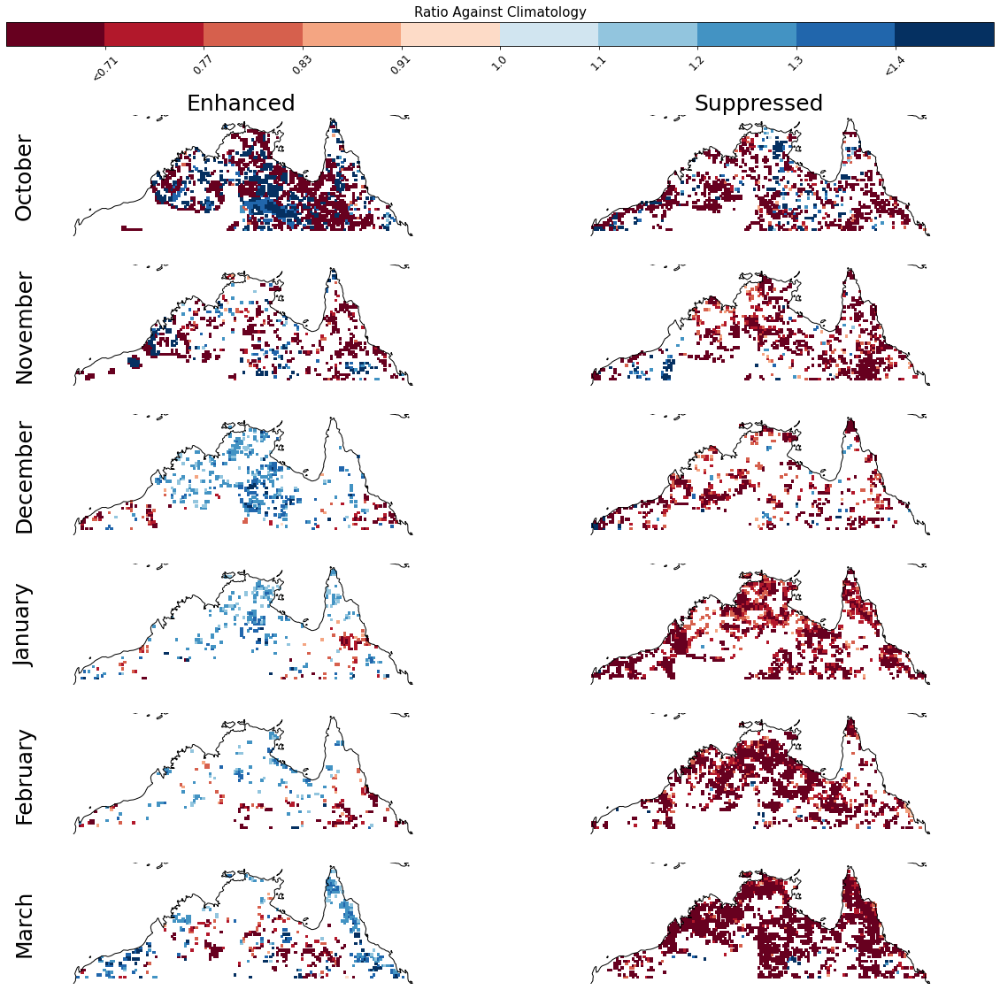

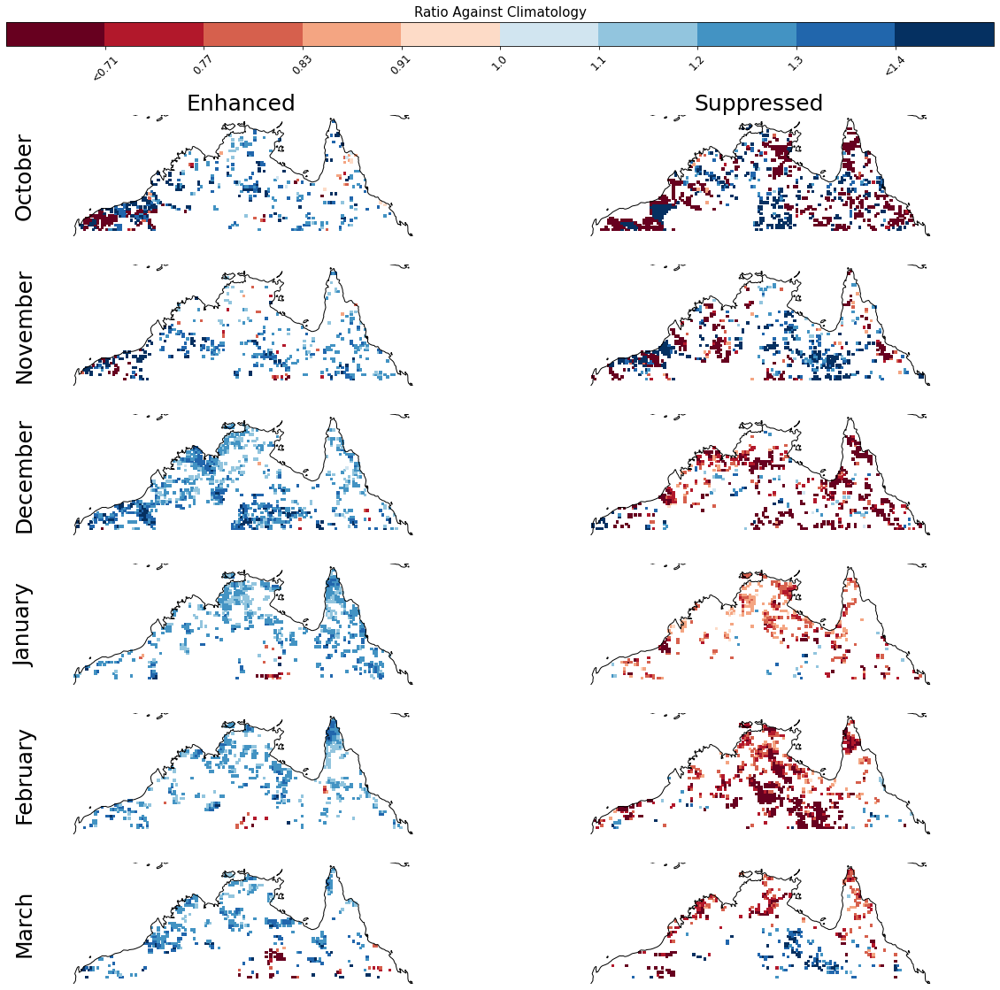

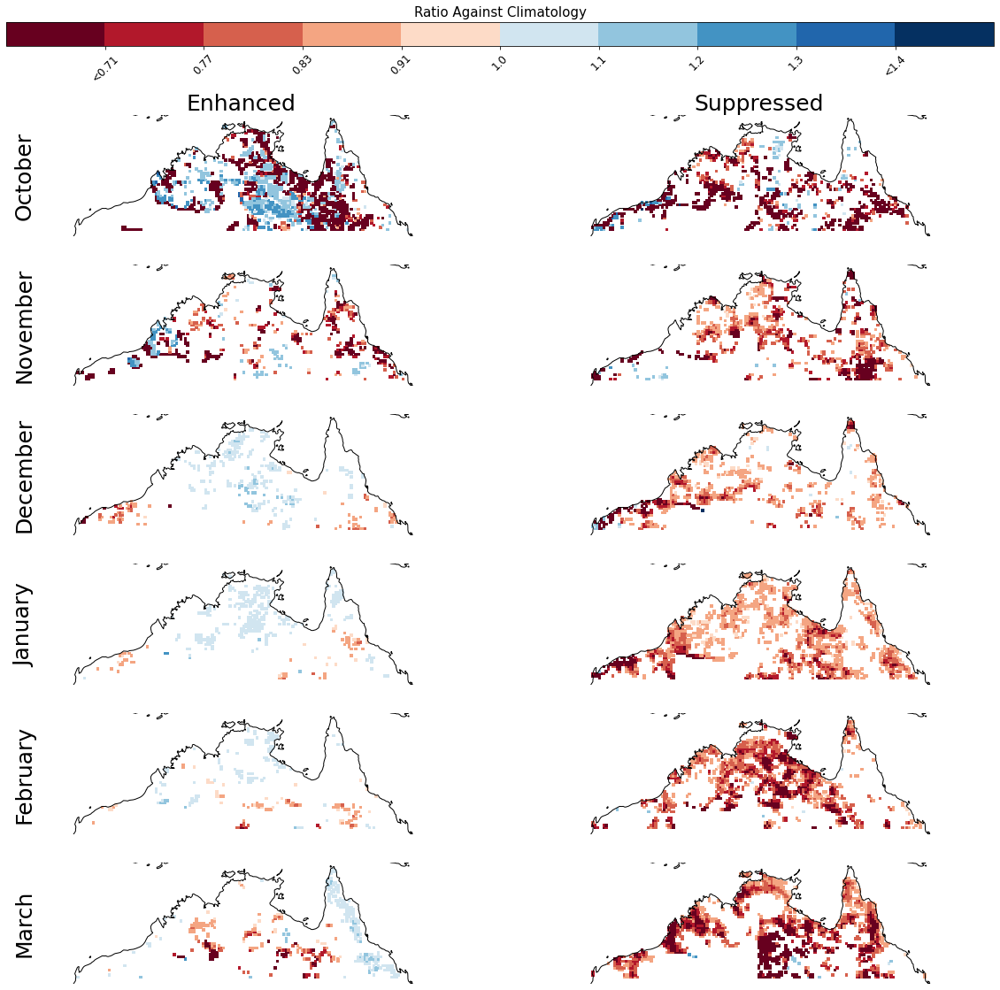

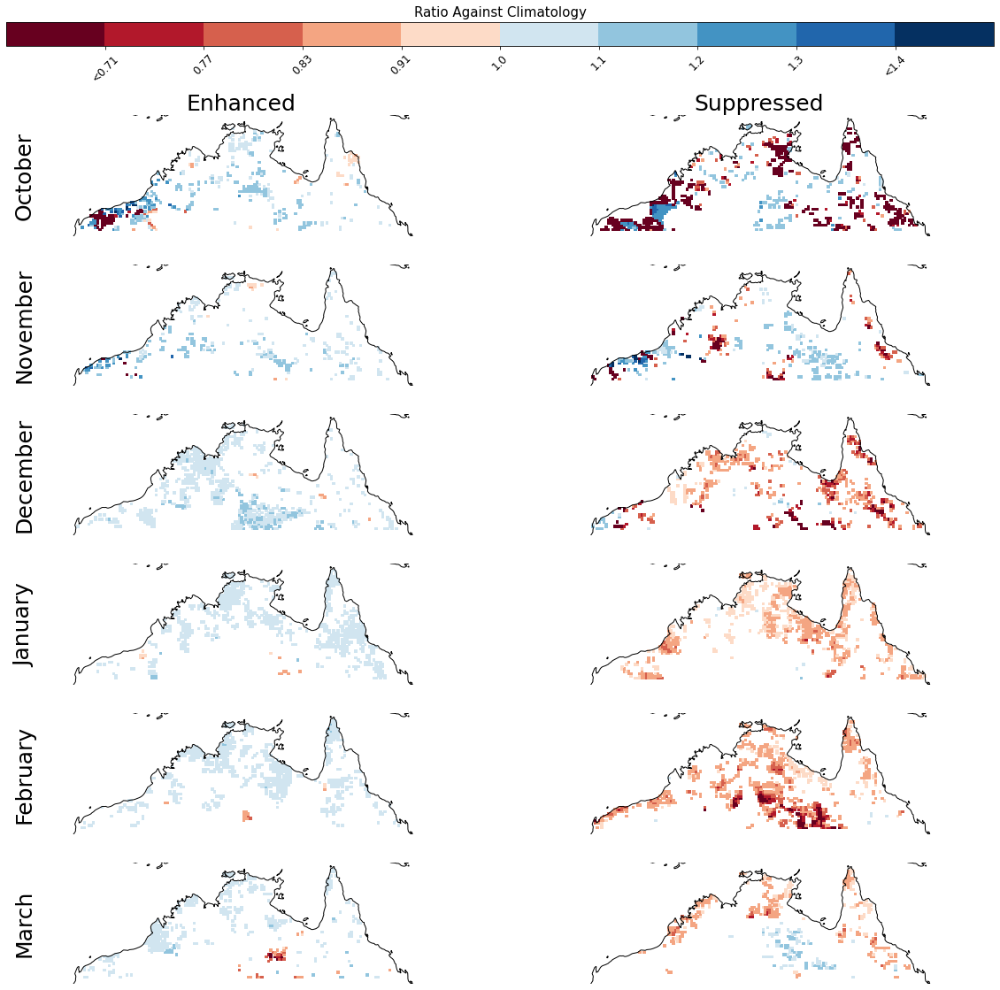

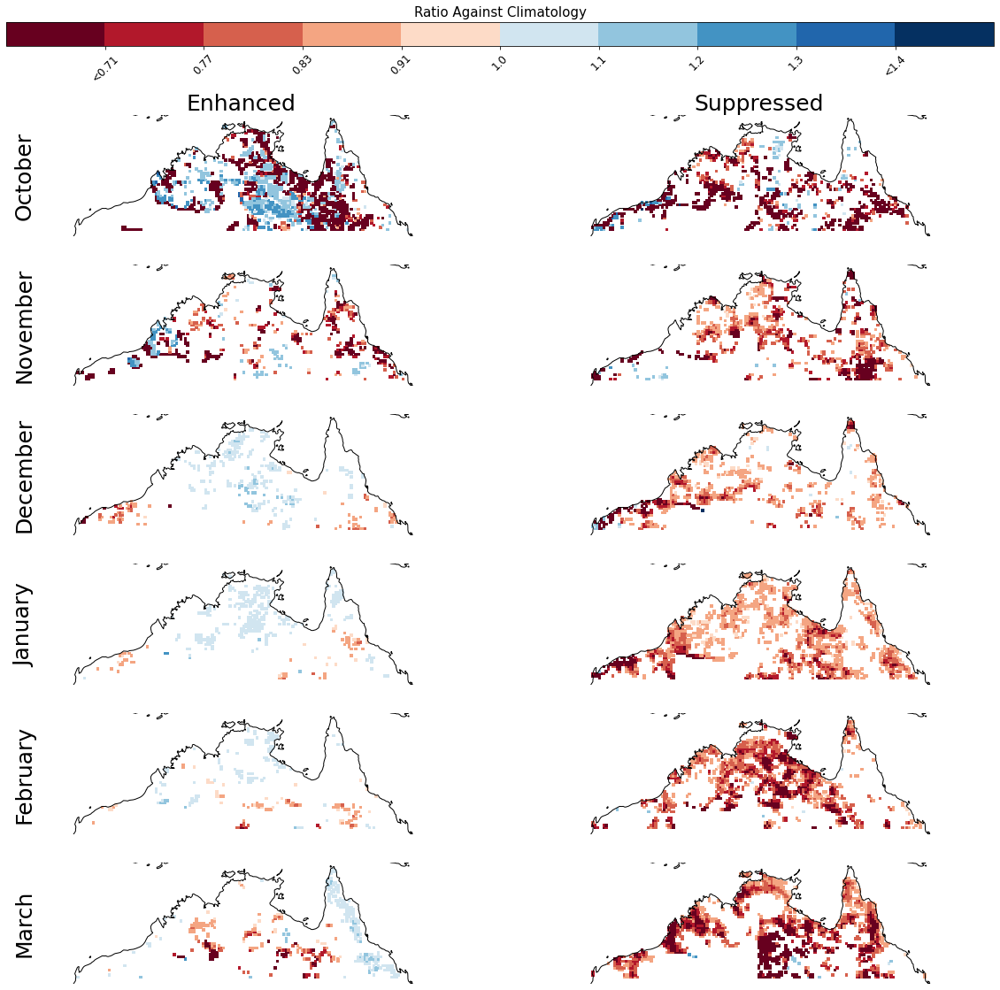

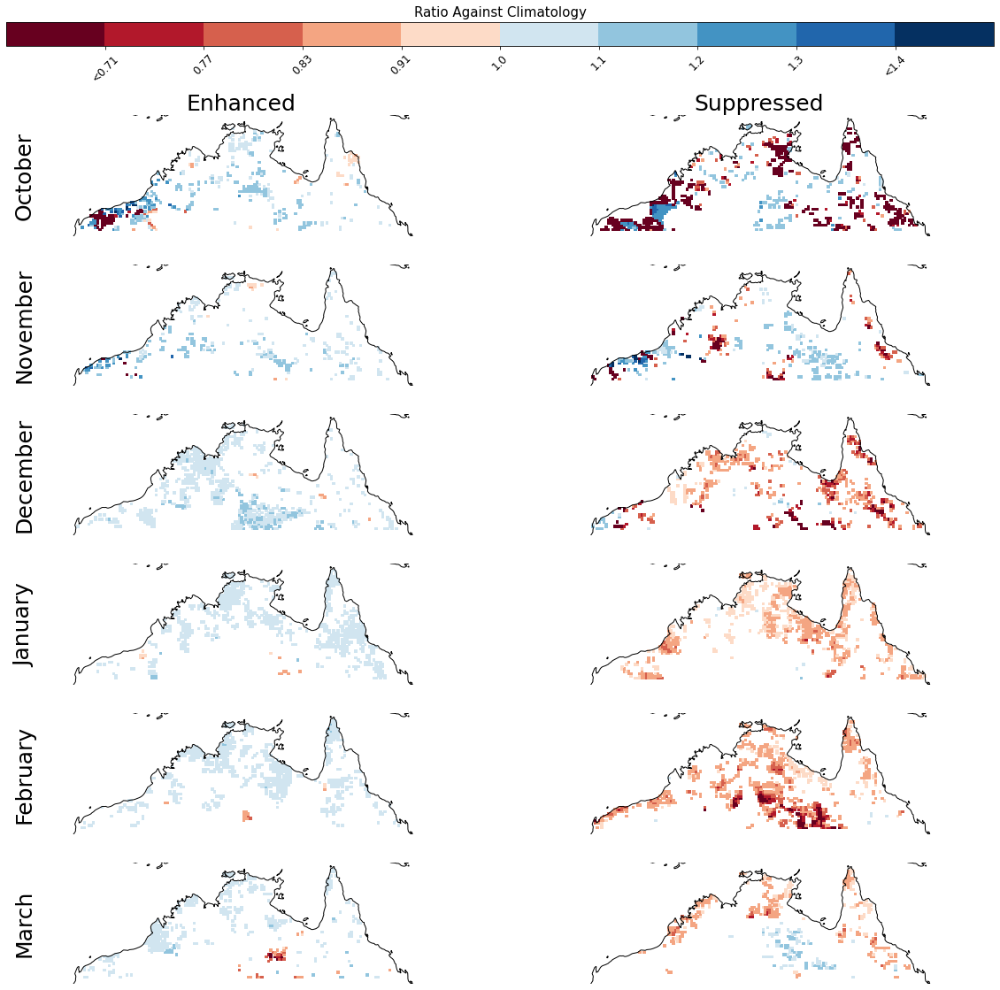

In [32]:
total_en_data = [count_anomaly_sig_enso, sum_anomaly_sig_enso, sum_anomaly_sig_enso] 
index = ['count','sum','int']
ninos = ['el nino','la nina']

for ind,data_en in zip(index,total_en_data):
    for nino in ninos:
        save_name = f'montly_{q}_{ind}_{nino[0]}'
        subplot_2.anomalies_plots_single_el_nino(data_en.sel(nino = nino)
                                                 , vmax = 1.5, figsize = (20,20), 
                                                cbar_title = 'Ratio Against Climatology',
                                                save_name = save_name, savedir = savedir)

In [ ]:
subplot_2 = reload(subplot_2)
month = 1
cbar_title = 'Anomaly'
data = count_anomaly_sig_enso
save_name = f'{month}_count_{q}'

subplot_2.enso_anomalies_plots_stippled(data.sel(month = month).precip,
                                   cbar_title = cbar_title,
                                        save_name = save_name, vmax = 2)

In [ ]:
subplot_2 = reload(subplot_2)

cbar_title = 'Anomaly'
data = int_anomaly_sig_enso


ind_type = f'int_{q}'

for month in [10,11,12,1,2,3]:
    if month == 10:
        vmax = 3
    else:
        vmax = 2
    
    save_name = f'{month}_{ind_type}'
    subplot_2.enso_anomalies_plots_stippled(data.sel(month = month).precip,
                                       cbar_title = cbar_title,
                                            save_name = save_name, vmax = vmax, savedir = savedir)

## Plotting All

In [27]:
import subphase_plot_functions_2 as subplot_2

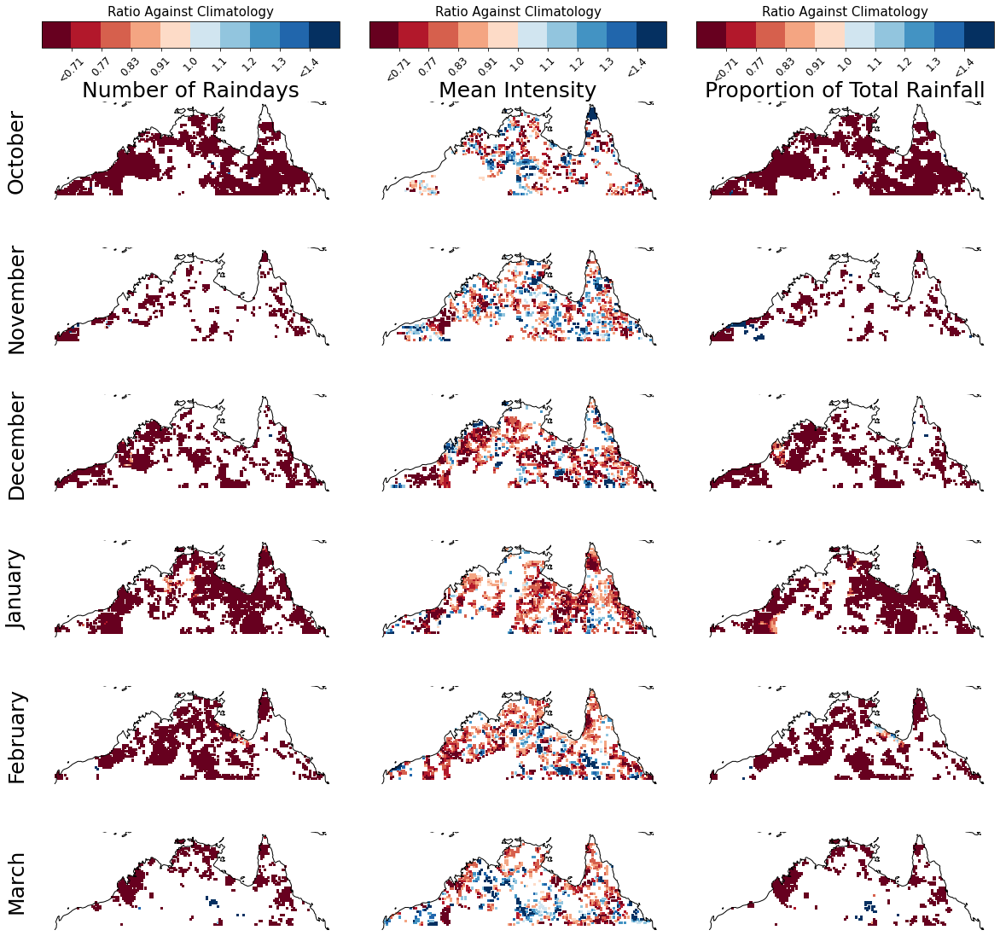

In [42]:
subplot_2 = reload(subplot_2) 
subplot_2.anomalies_plots_sigle_phase_all_month_different_cbar(count_anomaly_sig, int_anomaly_sig, sum_anomaly_sig,
                                           vmax1 = 1.5,vmax2 = 1.5, vmax3 = 1.5,                    
                                           phase = 'suppressed'
                                           , figsize = (20,20),
                                           cbar_title = 'Ratio Against Climatology'
                                                              )
#                                            ,save_name = '')

FileNotFoundError: [Errno 2] No such file or directory: 'anomalies/All_Index_50_enhanced.png'

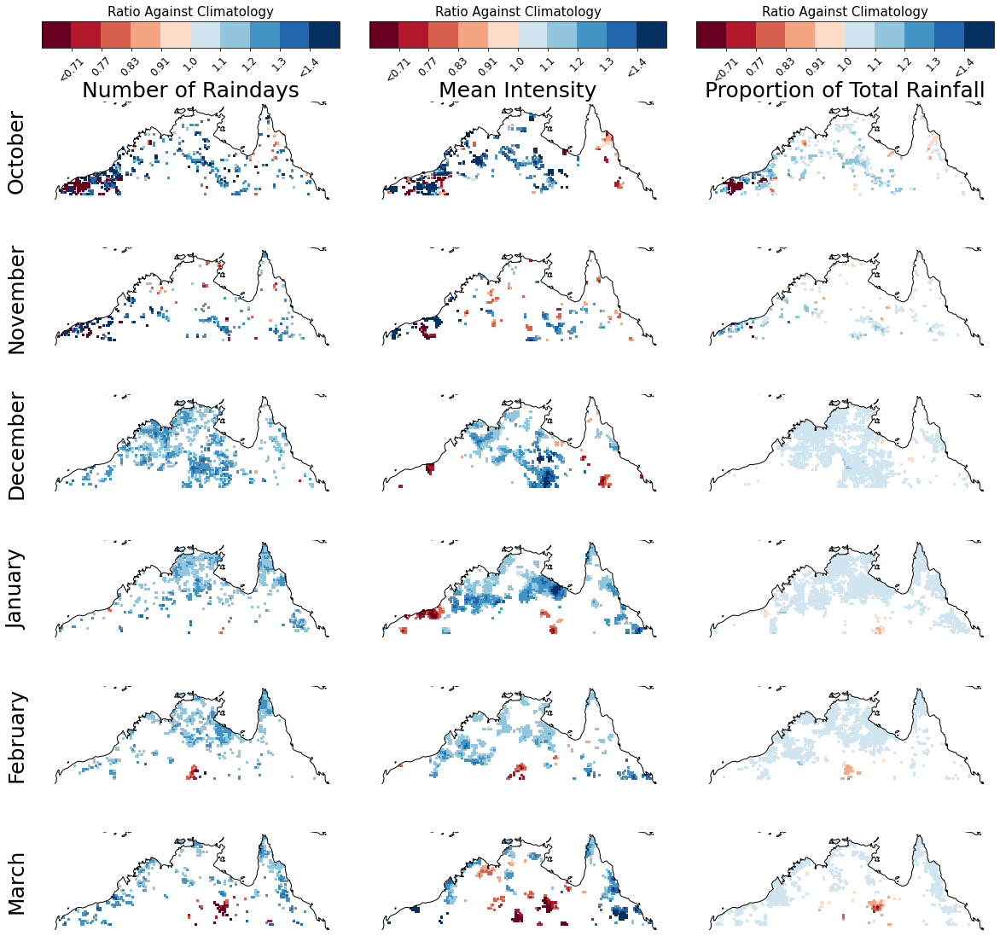

In [28]:
subplot_2 = reload(subplot_2) 
phases = count_anomaly.phase.values
vmax1 = 2
vmax2 = 2
vmax3 = 2
phases = ['enhanced', 'suppressed']
for phase in phases:
    save_name = f'All_Index_{q}_{phase}'
    
    if q >= 90:

        if phase == 'enhanced':
            vmax1 = 3
            vmax2 = 2
            vmax3 = 2
        if phase == 'suppressed':
            vmax1 = 5
            vmax2 = 2
            vmax3 = 2
    else:
        vmax1 = 1.5
        vmax2 = 1.5
        vmax3 =1.5
    subplot_2.anomalies_plots_sigle_phase_all_month_different_cbar(count_anomaly_sig, int_anomaly_sig,
                                                                   sum_anomaly_sig,
                                                   phase = phase,
                                                    vmax1 = vmax1, vmax2 = vmax2, vmax3 = vmax3   
                                                   , figsize = (20,20),
                                                   cbar_title = 'Ratio Against Climatology',
                                                   save_name = save_name
#                                                                   )
                                                    , savedir = savedir)

In [ ]:
subplot_2 = reload(subplot_2) 
phases = count_anomaly.phase.values

for phase in phases:
    save_name = f'All_Index_90_{phase}'
    savedir_all = 'anomalies/all_indices/'
    subplot_2.anomalies_plots_sigle_phase_all_month(count_anomaly, int_anomaly, sum_anomaly,
                                                   phase = phase
                                                   , figsize = (20,20),
                                                   cbar_title = 'Enhanced/Reduced Extreme Index',
                                                   save_name = save_name)
#                                                     , savedir = savedir_all)

In [ ]:
subplot_2 = reload(subplot_2) 
phase = 'enhanced'
save_name = f'Sig_All_Index_90_{phase}'
savedir_all = 'anomalies/all_indices/'
subplot_2.anomalies_plots_sigle_phase_all_month(count_anomaly_sig, int_anomaly_sig, sum_anomaly_sig,
                                               phase = phase
                                               , figsize = (20,20),
                                               cbar_title = 'Enhanced/Reduced Extreme Index',
                                               save_name = save_name)

In [ ]:
subplot_2 = reload(subplot_2) 
phases = count_anomaly.phase.values

for phase in phases:
    save_name = f'Sig_All_Index_90_{phase}'
    savedir_all = 'anomalies/all_indices/'
    subplot_2.anomalies_plots_sigle_phase_all_month(
        count_anomaly_sig, int_anomaly_sig, sum_anomaly_sig,
                                                   phase = phase
                                                   , figsize = (20,20),
                                                   cbar_title = 'Enhanced/Reduced Extreme Index',
                                                   save_name = save_name, savedir = savedir_all)